## 2 - Export Data Assessment (Gaze on Surface)

##### Imports

In [1]:
import os
import pandas as pd
import numpy as np
import scipy as su
# from typing import Dict
# from scipy.signal import
# from scikit-learn import

import matplotlib.pyplot as plt
import seaborn as sns

import dask.dataframe as dd

##### Data Loading

In [3]:
# Load ddfs into dictionary (exception for 'all_surf_pos', df)
root_dir = './aggregated_data'
def load_data(root_dir, exception=False):    # Get csv file reads into one dictionary
    data = {}
    for subdir, _, files in os.walk(root_dir):
        for file in files:
            file_path = os.path.join(subdir, file)
            file_name = os.path.splitext(file)[0]   #file name without '.csv'
            if file.endswith('.csv') and file != 'all_surf_positions_HiDrive_Studie2.csv':
                data[file_name] = dd.read_csv(file_path)    #read and attach to dict
            elif exception and file == 'all_surf_positions_HiDrive_Studie2.csv':
                data [file_name] = pd.read_csv(file_path, converters=converters)    #read as normal and attach to dict
    return data
def parse(filedata): # Manually read the column
    output = []
    for line in filedata.split('\n'): # split into lines
        line = line.strip().rstrip(']').lstrip('[') #remove whitespace and brackets
        if not line:
            continue    #skip empty lines
        line = line.split() #split into cell
        row = []
        for cell in line:
            cell = cell.strip()     #remove whitespace
            if not cell.strip():
                continue    #skip empty cells
            row.append(float(cell)) #convert to float and add
        output.append(row)
    return output
converters = {
    "img_to_surf_trans": parse,
    "surf_to_img_trans": parse,
    "dist_img_to_surf_trans": parse,
    "surf_to_dist_img_trans": parse,
}

data = load_data(root_dir)

In [4]:
participant_ids = [1,2,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]
ddf = data['all_gaze_positions_on_surface_HiDrive_Studie2'].iloc[:, 1:]
df = ddf.compute()

### 1. Inspection
Head & Tail,  Basic statistics,  Missing values

##### Head & tail

In [12]:
for pid in participant_ids:
    participant_df = df[df['participant_id'] == pid]
    display(f"Participant {pid}")
    display(participant_df.iloc[:, 1:].head())
    display(participant_df.iloc[:, 1:].tail())

'Participant 1'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
0,-672842.718256,0,-672842.855135,0.359305,0.808131,0.359305,0.808131,True,1.0
1,-672842.718256,0,-672842.851110,0.359901,0.810670,0.359901,0.810670,True,1.0
2,-672842.718256,0,-672842.847101,0.360482,0.809599,0.360482,0.809599,True,1.0
3,-672842.718256,0,-672842.843117,0.362924,0.810894,0.362924,0.810894,True,1.0
4,-672842.718256,0,-672842.839108,0.362649,0.811991,0.362649,0.811991,True,1.0


,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
8684,-668799.307013,116962,-668799.306100,0.321580,0.317629,0.321580,0.317629,True,1.0
8685,-668799.307013,116962,-668799.302049,0.322161,0.317986,0.322161,0.317986,True,1.0
8686,-668799.307013,116962,-668799.298064,0.322068,0.314949,0.322068,0.314949,True,1.0
8687,-668799.307013,116962,-668799.294124,0.324251,0.319334,0.324251,0.319334,True,1.0
8688,-668799.307013,116962,-668799.290102,0.324274,0.319434,0.324274,0.319434,True,1.0


'Participant 2'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
8689,-664549.39444,0,-664549.494946,0.446778,0.590413,0.446778,0.590413,True,1.0
8690,-664549.39444,0,-664549.490980,0.446331,0.589990,0.446331,0.589990,True,1.0
8691,-664549.39444,0,-664549.487056,0.448431,0.593024,0.448431,0.593024,True,1.0
8692,-664549.39444,0,-664549.483002,0.450058,0.597950,0.450058,0.597950,True,1.0
8693,-664549.39444,0,-664549.478952,0.450865,0.598206,0.450865,0.598206,True,1.0


,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
290018,-661485.316606,90024,-661485.320214,0.825008,0.085785,0.825008,0.085785,True,0.995
290019,-661485.316606,90024,-661485.316233,0.794909,0.181133,0.794909,0.181133,True,0.990
290020,-661485.316606,90024,-661485.307874,0.746022,0.187342,0.746022,0.187342,True,0.990
290021,-661485.316606,90024,-661485.301520,0.719099,0.292596,0.719099,0.292596,True,0.990
290022,-661485.316606,90024,-661485.299193,0.698532,0.363538,0.698532,0.363538,True,0.990


'Participant 4'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
290023,-587761.674974,0,-587761.779642,0.491947,0.949526,0.491947,0.949526,True,0.952837
290024,-587761.674974,0,-587761.775793,0.490919,0.948746,0.490919,0.948746,True,0.957615
290025,-587761.674974,0,-587761.772075,0.491596,0.946302,0.491596,0.946302,True,0.957615
290026,-587761.674974,0,-587761.768045,0.492691,0.948117,0.492691,0.948117,True,0.864360
290027,-587761.674974,0,-587761.764006,0.493414,0.946126,0.493414,0.946126,True,0.864360


,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
133528,-584619.466492,81084,-584619.471394,0.172625,-0.861156,0.172625,-0.861156,False,0.452685
133529,-584619.466492,81084,-584619.461869,0.216700,-0.813585,0.216700,-0.813585,False,0.343968
133530,-584619.466492,81084,-584619.455062,0.162086,-0.932540,0.162086,-0.932540,False,0.416654
133531,-584619.466492,81084,-584619.447515,0.203042,-1.180248,0.203042,-1.180248,False,0.444882
133532,-584619.466492,81084,-584619.437075,0.265399,-1.613728,0.265399,-1.613728,False,0.232870


'Participant 5'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
133533,-578913.041447,0,-578913.176512,0.342824,0.439973,0.342824,0.439973,True,1.000000
133534,-578913.041447,0,-578913.172453,0.347007,0.431033,0.347007,0.431033,True,0.971288
133535,-578913.041447,0,-578913.168452,0.373803,0.445906,0.373803,0.445906,True,0.966288
133536,-578913.041447,0,-578913.164528,0.379870,0.434894,0.379870,0.434894,True,0.990000
133537,-578913.041447,0,-578913.160504,0.379628,0.435733,0.379628,0.435733,True,0.995000


,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
53340,-575204.181257,100853,-575204.185893,3.502818,-2.805092,3.502818,-2.805092,False,1.000000
53341,-575204.181257,100853,-575204.181937,3.525475,-2.819952,3.525475,-2.819952,False,1.000000
53342,-575204.181257,100853,-575204.177950,3.553236,-2.838728,3.553236,-2.838728,False,0.988691
53343,-575204.181257,100853,-575204.173948,3.564298,-2.844694,3.564298,-2.844694,False,0.988691
53344,-575204.181257,100853,-575204.169926,3.586126,-2.859658,3.586126,-2.859658,False,1.000000


'Participant 6'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
53345,82162.225339,0,82162.125341,0.255607,0.499005,0.255607,0.499005,True,0.923694
53346,82162.225339,0,82162.129288,0.255439,0.500796,0.255439,0.500796,True,0.923694
53347,82162.225339,0,82162.133246,0.256385,0.501501,0.256385,0.501501,True,0.936647
53348,82162.225339,0,82162.137317,0.256575,0.503468,0.256575,0.503468,True,0.936647
53349,82162.225339,0,82162.141336,0.257349,0.500073,0.257349,0.500073,True,0.908021


,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
352535,85415.426647,96776,85415.425337,0.094374,-0.391856,0.094374,-0.391856,False,1.000000
352536,85415.426647,96776,85415.429357,0.096159,-0.390588,0.096159,-0.390588,False,1.000000
352537,85415.426647,96776,85415.433339,0.096728,-0.389783,0.096728,-0.389783,False,0.942733
352538,85415.426647,96776,85415.437329,0.097598,-0.392079,0.097598,-0.392079,False,0.942733
352539,85415.426647,96776,85415.441340,0.096190,-0.388279,0.096190,-0.388279,False,0.967142


'Participant 7'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
352540,349980.579293,0,349980.479169,0.339624,0.853758,0.339624,0.853758,True,0.994686
352541,349980.579293,0,349980.483165,0.339585,0.854114,0.339585,0.854114,True,0.994686
352542,349980.579293,0,349980.487185,0.339616,0.855471,0.339616,0.855471,True,1.000000
352543,349980.579293,0,349980.491204,0.339941,0.855445,0.339941,0.855445,True,1.000000
352544,349980.579293,0,349980.495202,0.339858,0.855219,0.339858,0.855219,True,1.000000


,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
145836,353175.983197,95270,353175.980309,0.602453,0.978714,0.602453,0.978714,True,1.0
145837,353175.983197,95270,353175.984364,0.598439,0.981408,0.598439,0.981408,True,1.0
145838,353175.983197,95270,353175.988374,0.595168,0.982184,0.595168,0.982184,True,1.0
145839,353175.983197,95270,353175.992277,0.593715,0.982704,0.593715,0.982704,True,1.0
145840,353175.983197,95270,353175.996220,0.590595,0.983428,0.590595,0.983428,True,1.0


'Participant 8'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
145841,4131.593964,0,4131.476601,0.621881,0.403632,0.621881,0.403632,True,0.979458
145842,4131.593964,0,4131.480606,0.619305,0.403059,0.619305,0.403059,True,0.980714
145843,4131.593964,0,4131.484624,0.618874,0.403594,0.618874,0.403594,True,0.980714
145844,4131.593964,0,4131.488638,0.618454,0.406749,0.618454,0.406749,True,0.945238
145845,4131.593964,0,4131.492630,0.618475,0.406995,0.618475,0.406995,True,0.945238


,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
450407,7344.906988,95837,7344.901936,1.511985,1.571457,1.511985,1.571457,False,0.255640
450408,7344.906988,95837,7344.905933,0.612811,0.669735,0.612811,0.669735,True,1.000000
450409,7344.906988,95837,7344.909937,1.482572,1.686878,1.482572,1.686878,False,0.227291
450410,7344.906988,95837,7344.917934,1.675571,1.670121,1.675571,1.670121,False,0.186479
450411,7344.906988,95837,7344.925952,3.146507,2.981044,3.146507,2.981044,False,0.116534


'Participant 9'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
450412,22196.693916,0,22195.926929,0.593359,0.886358,0.593359,0.886358,True,0.984329
450413,22196.693916,0,22195.932943,0.594048,0.886964,0.594048,0.886964,True,0.984329
450414,22196.693916,0,22195.936955,0.589749,0.883116,0.589749,0.883116,True,0.972166
450415,22196.693916,0,22195.940968,0.591256,0.880093,0.591256,0.880093,True,0.972166
450416,22196.693916,0,22195.946826,0.589103,0.874120,0.589103,0.874120,True,0.986009


,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
242891,25449.603278,97014,25449.598352,0.521834,0.841348,0.521834,0.841348,True,1.0
242892,25449.603278,97014,25449.602372,0.520772,0.837170,0.520772,0.837170,True,1.0
242893,25449.603278,97014,25449.606336,0.519591,0.841164,0.519591,0.841164,True,1.0
242894,25449.603278,97014,25449.610283,0.519420,0.842853,0.519420,0.842853,True,1.0
242895,25449.603278,97014,25449.614332,0.519656,0.842752,0.519656,0.842752,True,1.0


'Participant 10'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
242896,5423.373465,0,5422.582547,0.417825,0.667019,0.417825,0.667019,True,0.506091
242897,5423.373465,0,5422.582600,0.556701,0.909748,0.556701,0.909748,True,0.990000
242898,5423.373465,0,5422.590560,0.400650,0.808734,0.400650,0.808734,True,0.293020
242899,5423.373465,0,5422.590564,0.353817,0.714851,0.353817,0.714851,True,0.298334
242900,5423.373465,0,5422.598539,0.384599,0.806403,0.384599,0.806403,True,0.322635


,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
43977,8724.214638,98431,8724.229839,0.858237,45.161812,0.858237,45.161812,False,0.453388
43978,8724.214638,98431,8724.237638,0.998820,57.057629,0.998820,57.057629,False,0.449149
43979,8724.214638,98431,8724.245597,0.836647,118.383263,0.836647,118.383263,False,0.429164
43980,8724.214638,98431,8724.253663,0.847355,59.398167,0.847355,59.398167,False,0.493519
43981,8724.214638,98431,8724.261644,0.383327,-21.649221,0.383327,-21.649221,False,0.373119


'Participant 11'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
43982,16541.754802,0,16540.941312,0.581606,0.518771,0.581606,0.518771,True,1.0
43983,16541.754802,0,16540.945292,0.580044,0.517326,0.580044,0.517326,True,1.0
43984,16541.754802,0,16540.949287,0.582186,0.518813,0.582186,0.518813,True,1.0
43985,16541.754802,0,16540.955285,0.583107,0.517299,0.583107,0.517299,True,1.0
43986,16541.754802,0,16540.959273,0.585523,0.520180,0.585523,0.520180,True,1.0


,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
339896,19781.555372,96621,19781.556368,0.662848,1.281449,0.662848,1.281449,False,1.0
339897,19781.555372,96621,19781.560387,0.665353,1.276107,0.665353,1.276107,False,1.0
339898,19781.555372,96621,19781.564392,0.667359,1.274853,0.667359,1.274853,False,1.0
339899,19781.555372,96621,19781.568376,0.669786,1.273996,0.669786,1.273996,False,1.0
339900,19781.555372,96621,19781.572351,0.670146,1.272710,0.670146,1.272710,False,1.0


'Participant 12'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
339901,84203.90184,0,84203.810397,0.387052,0.462410,0.387052,0.462410,True,0.757837
339902,84203.90184,0,84203.810431,-0.273066,-0.344238,-0.273066,-0.344238,False,0.781469
339903,84203.90184,0,84203.818371,-0.985487,-0.034114,-0.985487,-0.034114,False,0.191574
339904,84203.90184,0,84203.818385,0.406276,0.361472,0.406276,0.361472,True,0.880344
339905,84203.90184,0,84203.826323,1.267323,-0.581312,1.267323,-0.581312,False,0.000000


,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
143882,87442.10498,96569,87442.106017,0.460902,0.710920,0.460902,0.710920,True,0.963043
143883,87442.10498,96569,87442.109977,0.459518,0.708762,0.459518,0.708762,True,0.963043
143884,87442.10498,96569,87442.113998,0.458104,0.715687,0.458104,0.715687,True,1.000000
143885,87442.10498,96569,87442.118025,0.454121,0.713087,0.454121,0.713087,True,1.000000
143886,87442.10498,96569,87442.121981,0.453489,0.720656,0.453489,0.720656,True,1.000000


'Participant 13'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
143887,93626.211839,0,93626.060882,0.490770,0.587411,0.490770,0.587411,True,0.99751
143888,93626.211839,0,93626.064880,0.491478,0.586305,0.491478,0.586305,True,1.00000
143889,93626.211839,0,93626.068855,0.491162,0.587151,0.491162,0.587151,True,1.00000
143890,93626.211839,0,93626.072876,0.491091,0.588581,0.491091,0.588581,True,1.00000
143891,93626.211839,0,93626.076892,0.490971,0.585485,0.490971,0.585485,True,1.00000


,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
28438,97300.529676,109566,97300.526653,0.342927,0.710971,0.342927,0.710971,True,1.0
28439,97300.529676,109566,97300.530675,0.342960,0.709403,0.342960,0.709403,True,1.0
28440,97300.529676,109566,97300.534752,0.343307,0.710643,0.343307,0.710643,True,1.0
28441,97300.529676,109566,97300.538836,0.343225,0.708990,0.343225,0.708990,True,1.0
28442,97300.529676,109566,97300.544810,0.345177,0.709072,0.345177,0.709072,True,1.0


'Participant 14'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
28443,99784.673516,0,99783.895839,0.537625,0.371017,0.537625,0.371017,True,1.000000
28444,99784.673516,0,99783.899855,0.535020,0.379154,0.535020,0.379154,True,1.000000
28445,99784.673516,0,99783.903859,0.533795,0.377626,0.533795,0.377626,True,1.000000
28446,99784.673516,0,99783.907820,0.531001,0.380347,0.531001,0.380347,True,0.978826
28447,99784.673516,0,99783.911829,0.529118,0.375705,0.529118,0.375705,True,0.978826


,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
380862,103247.148492,103241,103247.147433,0.327344,0.800640,0.327344,0.800640,True,1.0
380863,103247.148492,103241,103247.151445,0.328856,0.796993,0.328856,0.796993,True,1.0
380864,103247.148492,103241,103247.155458,0.331654,0.800484,0.331654,0.800484,True,1.0
380865,103247.148492,103241,103247.159471,0.330976,0.802008,0.330976,0.802008,True,1.0
380866,103247.148492,103241,103247.163459,0.330195,0.804934,0.330195,0.804934,True,1.0


'Participant 15'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
380867,3148.486389,0,3148.386470,0.379370,0.658495,0.379370,0.658495,True,0.950891
380868,3148.486389,0,3148.392401,0.378898,0.657444,0.378898,0.657444,True,0.950891
380869,3148.486389,0,3148.396371,0.379406,0.657471,0.379406,0.657471,True,0.907513
380870,3148.486389,0,3148.400384,0.378697,0.657046,0.378697,0.657046,True,0.907513
380871,3148.486389,0,3148.404400,0.378702,0.656439,0.378702,0.656439,True,0.916933


,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
207311,6444.423059,98274,6444.418129,0.594789,0.528649,0.594789,0.528649,True,1.000000
207312,6444.423059,98274,6444.422132,0.596019,0.528839,0.596019,0.528839,True,0.972863
207313,6444.423059,98274,6444.426099,0.598655,0.530402,0.598655,0.530402,True,1.000000
207314,6444.423059,98274,6444.430069,0.598549,0.532332,0.598549,0.532332,True,1.000000
207315,6444.423059,98274,6444.434128,0.600236,0.531365,0.600236,0.531365,True,0.975989


'Participant 16'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
207316,87725.767887,0,87725.672077,0.515065,0.562619,0.515065,0.562619,True,1.0
207317,87725.767887,0,87725.676066,0.514518,0.562102,0.514518,0.562102,True,1.0
207318,87725.767887,0,87725.680084,0.513909,0.562199,0.513909,0.562199,True,1.0
207319,87725.767887,0,87725.684169,0.514007,0.557256,0.514007,0.557256,True,1.0
207320,87725.767887,0,87725.688155,0.514463,0.555668,0.514463,0.555668,True,1.0


,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
145738,91478.755664,111916,91478.756659,0.488251,0.582134,0.488251,0.582134,True,0.990
145739,91478.755664,111916,91478.760659,0.510642,0.544907,0.510642,0.544907,True,0.990
145740,91478.755664,111916,91478.764617,0.538148,0.540300,0.538148,0.540300,True,0.990
145741,91478.755664,111916,91478.768594,0.546149,0.527002,0.546149,0.527002,True,0.995
145742,91478.755664,111916,91478.772615,0.557135,0.527159,0.557135,0.527159,True,1.000


'Participant 17'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
145743,2660.045476,0,2659.952896,0.448206,0.682913,0.448206,0.682913,True,1.0
145744,2660.045476,0,2659.956900,0.446661,0.683687,0.446661,0.683687,True,1.0
145745,2660.045476,0,2659.961474,0.445070,0.687186,0.445070,0.687186,True,1.0
145746,2660.045476,0,2659.965477,0.445535,0.687711,0.445535,0.687711,True,1.0
145747,2660.045476,0,2659.968934,0.446226,0.688087,0.446226,0.688087,True,1.0


,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
441978,5894.537216,96392,5894.525922,0.552350,0.442460,0.552350,0.442460,True,0.964021
441979,5894.537216,96392,5894.529897,0.552275,0.441162,0.552275,0.441162,True,0.964021
441980,5894.537216,96392,5894.533536,0.552095,0.440528,0.552095,0.440528,True,0.946427
441981,5894.537216,96392,5894.537541,0.551569,0.441901,0.551569,0.441901,True,0.946427
441982,5894.537216,96392,5894.541569,0.551888,0.441717,0.551888,0.441717,True,0.935670


'Participant 18'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
441983,4063.06284,0,4062.962759,0.703695,0.869374,0.703695,0.869374,True,1.0
441984,4063.06284,0,4062.966751,0.703284,0.869896,0.703284,0.869896,True,1.0
441985,4063.06284,0,4062.970766,0.702822,0.869133,0.702822,0.869133,True,1.0
441986,4063.06284,0,4062.974809,0.703020,0.868369,0.703020,0.868369,True,1.0
441987,4063.06284,0,4062.978809,0.702311,0.868240,0.702311,0.868240,True,1.0


,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
331367,7661.667001,107250,7661.667030,0.814524,0.888712,0.814524,0.888712,True,1.0
331368,7661.667001,107250,7661.671084,0.814632,0.887315,0.814632,0.887315,True,1.0
331369,7661.667001,107250,7661.675108,0.815019,0.887145,0.815019,0.887145,True,1.0
331370,7661.667001,107250,7661.679055,0.814701,0.886173,0.814701,0.886173,True,1.0
331371,7661.667001,107250,7661.683012,0.814784,0.886967,0.814784,0.886967,True,1.0


'Participant 19'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
331372,71588.54001,0,71588.426261,0.371184,0.556253,0.371184,0.556253,True,0.942939
331373,71588.54001,0,71588.430277,0.371521,0.554050,0.371521,0.554050,True,0.967488
331374,71588.54001,0,71588.434287,0.372532,0.555899,0.372532,0.555899,True,0.967488
331375,71588.54001,0,71588.438246,0.372649,0.555771,0.372649,0.555771,True,0.873859
331376,71588.54001,0,71588.442192,0.373471,0.555203,0.373471,0.555203,True,0.873859


,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
127183,74959.687772,100471,74959.683027,-0.436155,-1.618889,-0.436155,-1.618889,False,0.690338
127184,74959.687772,100471,74959.686751,-0.437032,-1.664142,-0.437032,-1.664142,False,0.690338
127185,74959.687772,100471,74959.691218,-0.445958,-1.658535,-0.445958,-1.658535,False,0.690338
127186,74959.687772,100471,74959.695205,-0.433837,-1.635616,-0.433837,-1.635616,False,0.715344
127187,74959.687772,100471,74959.702704,2.611039,6.780891,2.611039,6.780891,False,0.151936


'Participant 20'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
127188,80485.637659,0,80484.825502,0.364178,0.728739,0.364178,0.728739,True,1.0
127189,80485.637659,0,80484.829500,0.363826,0.727070,0.363826,0.727070,True,1.0
127190,80485.637659,0,80484.833489,0.363884,0.729558,0.363884,0.729558,True,1.0
127191,80485.637659,0,80484.837500,0.364692,0.730386,0.364692,0.730386,True,1.0
127192,80485.637659,0,80484.841544,0.364105,0.726789,0.364105,0.726789,True,1.0


,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
496437,83997.401185,104721,83997.408060,0.324303,-1.058438,0.324303,-1.058438,False,0.317799
496438,83997.401185,104721,83997.416253,0.308921,-1.081488,0.308921,-1.081488,False,0.320350
496439,83997.401185,104721,83997.424189,0.287615,-1.062352,0.287615,-1.062352,False,0.332705
496440,83997.401185,104721,83997.432024,0.117426,-1.650194,0.117426,-1.650194,False,0.291941
496441,83997.401185,104721,83997.440085,0.245841,-1.174297,0.245841,-1.174297,False,0.285351


##### Basic statistics
- P08 low confidence
- norm = scaled coordinates
- coordinates outliers

In [13]:
for pid in participant_ids:
    participant_df = df[df['participant_id'] == pid]
    display(f"Participant {pid}")
    display(participant_df.iloc[:, 1:].describe())

'Participant 1'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,confidence
count,988306.000000,988306.000000,988306.000000,988306.000000,988306.000000,988306.000000,988306.000000,988306.000000
mean,-670825.278647,57855.241829,-670825.278662,0.464692,0.624794,0.464692,0.624794,0.988683
std,1167.744019,33672.217646,1167.743967,4.457112,1.349837,4.457112,1.349837,0.076628
min,-672842.718256,0.000000,-672842.855135,-3991.454346,-157.678986,-3991.454346,-157.678986,0.000000
25%,-671839.068076,28683.000000,-671839.063795,0.371882,0.459597,0.371882,0.459597,1.000000
50%,-670827.148804,57588.000000,-670827.140505,0.485253,0.689315,0.485253,0.689315,1.000000
75%,-669813.567386,86719.000000,-669813.557359,0.601891,0.834723,0.601891,0.834723,1.000000
max,-668799.307013,116962.000000,-668799.290102,534.463379,1083.732422,534.463379,1083.732422,1.000000


'Participant 2'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,confidence
count,753748.000000,753748.000000,753748.000000,753748.000000,753748.000000,753748.000000,753748.000000,753748.000000
mean,-663015.334021,45089.839616,-663015.334018,0.524019,0.620534,0.524019,0.620534,0.939136
std,884.438767,25957.237959,884.438762,1.811989,3.870514,1.811989,3.870514,0.142368
min,-664549.394440,0.000000,-664549.494946,-280.442780,-2371.912598,-280.442780,-2371.912598,0.000000
25%,-663780.526819,22669.750000,-663780.535781,0.429724,0.450038,0.429724,0.450038,0.933042
50%,-663013.790198,45183.000000,-663013.792648,0.524522,0.569628,0.524522,0.569628,0.996550
75%,-662248.557454,67526.000000,-662248.569444,0.619432,0.861459,0.619432,0.861459,1.000000
max,-661485.316606,90024.000000,-661485.299193,1200.261841,1549.076416,1200.261841,1549.076416,1.000000


'Participant 4'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,confidence
count,762344.000000,762344.000000,762344.000000,762344.000000,762344.000000,762344.000000,762344.000000,762344.000000
mean,-586191.301622,40675.410237,-586191.301579,0.474409,0.659767,0.474409,0.659767,0.931757
std,907.472782,23225.643600,907.472799,12.657650,58.757557,12.657650,58.757557,0.146137
min,-587761.674974,0.000000,-587761.779642,-852.669556,-49278.453125,-852.669556,-49278.453125,0.000000
25%,-586977.260752,20705.000000,-586977.242393,0.330825,0.542720,0.330825,0.542720,0.936734
50%,-586192.712523,40772.000000,-586192.721864,0.447169,0.787158,0.447169,0.787158,0.968873
75%,-585403.953444,60652.000000,-585403.958210,0.569051,0.890688,0.569051,0.890688,0.993351
max,-584619.466492,81084.000000,-584619.437075,11008.360352,13807.735352,11008.360352,13807.735352,1.000000


'Participant 5'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,confidence
count,888485.000000,888485.000000,888485.000000,888485.000000,888485.000000,888485.000000,888485.000000,888485.000000
mean,-577067.794761,49927.717064,-577067.794727,0.499465,0.589098,0.499465,0.589098,0.973857
std,1070.220615,29034.873415,1070.220618,4.538842,0.955369,4.538842,0.955369,0.125435
min,-578913.041447,0.000000,-578913.176512,-2150.121582,-228.241028,-2150.121582,-228.241028,0.000000
25%,-577997.339572,24633.000000,-577997.331637,0.380196,0.424089,0.380196,0.424089,1.000000
50%,-577072.330087,49812.000000,-577072.328149,0.480631,0.632368,0.480631,0.632368,1.000000
75%,-576142.527716,74933.000000,-576142.512028,0.581357,0.805315,0.581357,0.805315,1.000000
max,-575204.181257,100853.000000,-575204.169926,1905.156372,665.581482,1905.156372,665.581482,1.000000


'Participant 6'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,confidence
count,800324.000000,800324.000000,800324.000000,800324.000000,800324.000000,800324.000000,800324.000000,800324.000000
mean,83787.884040,48388.274661,83787.883988,0.493728,0.583870,0.493728,0.583870,0.990303
std,938.572653,27917.813542,938.572679,341.157290,46.546128,341.157290,46.546128,0.072499
min,82162.225339,0.000000,82162.125341,-182794.375000,-26902.558594,-182794.375000,-26902.558594,0.000000
25%,82976.035729,24245.000000,82976.051849,0.363639,0.487796,0.363639,0.487796,1.000000
50%,83787.536579,48402.000000,83787.546312,0.459339,0.713183,0.459339,0.713183,1.000000
75%,84601.942381,72617.000000,84601.947036,0.575099,0.829250,0.575099,0.829250,1.000000
max,85415.426647,96776.000000,85415.441340,179486.328125,17764.158203,179486.328125,17764.158203,1.000000


'Participant 7'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,confidence
count,788343.000000,788343.000000,788343.000000,788343.000000,788343.000000,788343.000000,788343.000000,788343.000000
mean,351578.504495,47636.887926,351578.504433,0.526494,0.699844,0.526494,0.699844,0.960675
std,923.326908,27535.896283,923.326917,6.060602,4.108718,6.060602,4.108718,0.123213
min,349980.579293,0.000000,349980.479169,-2598.851562,-2901.628662,-2598.851562,-2901.628662,0.000000
25%,350777.743952,23757.000000,350777.742948,0.387838,0.529512,0.387838,0.529512,0.986450
50%,351579.615701,47676.000000,351579.630787,0.502200,0.754900,0.502200,0.754900,1.000000
75%,352379.175551,71508.000000,352379.170439,0.617650,0.887785,0.617650,0.887785,1.000000
max,353175.983197,95270.000000,353175.996220,3645.090088,430.209290,3645.090088,430.209290,1.000000


'Participant 8'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,confidence
count,792674.000000,792674.000000,792674.000000,792674.000000,792674.000000,792674.000000,792674.000000,792674.000000
mean,5737.125275,47873.281843,5737.125190,0.498092,0.660076,0.498092,0.660076,0.873379
std,927.794706,27677.083898,927.794690,7.233876,12.412511,7.233876,12.412511,0.220626
min,4131.593964,0.000000,4131.476601,-3948.298584,-1155.622803,-3948.298584,-1155.622803,0.000000
25%,4933.527503,23900.000000,4933.537963,0.407940,0.502848,0.407940,0.502848,0.867869
50%,5736.471357,47853.000000,5736.482277,0.493588,0.732487,0.493588,0.732487,0.975109
75%,6540.146139,71826.750000,6540.139176,0.593200,0.845045,0.593200,0.845045,1.000000
max,7344.906988,95837.000000,7344.925952,517.938354,10175.531250,517.938354,10175.531250,1.000000


'Participant 9'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,confidence
count,788731.000000,788731.000000,788731.000000,788731.000000,788731.000000,788731.000000,788731.000000,788731.000000
mean,23835.181314,48861.945250,23835.181146,0.439937,0.605168,0.439937,0.605168,0.986785
std,937.887321,27971.454966,937.887541,19.067619,31.944829,19.067619,31.944829,0.083388
min,22196.693916,0.000000,22195.926929,-10263.388672,-27620.005859,-10263.388672,-27620.005859,0.000000
25%,23012.025042,24314.000000,23012.012224,0.410834,0.492449,0.410834,0.492449,1.000000
50%,23845.695798,49170.000000,23845.696635,0.500115,0.710901,0.500115,0.710901,1.000000
75%,24646.895473,73069.000000,24646.898471,0.613232,0.853072,0.613232,0.853072,1.000000
max,25449.603278,97014.000000,25449.614332,10261.250977,846.239380,10261.250977,846.239380,1.000000


'Participant 10'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,confidence
count,811566.000000,811566.000000,811566.000000,811566.000000,811566.000000,811566.000000,811566.000000,811566.000000
mean,7073.094439,49190.604240,7073.094283,0.452039,0.661562,0.452039,0.661562,0.974112
std,953.381067,28431.590827,953.381166,14.286135,10.630486,14.286135,10.630486,0.118340
min,5423.373465,0.000000,5422.582547,-1797.260986,-5429.833496,-1797.260986,-5429.833496,0.000000
25%,6248.027949,24584.000000,6248.020330,0.360691,0.501309,0.360691,0.501309,1.000000
50%,7072.354090,49167.000000,7072.354119,0.456585,0.720628,0.456585,0.720628,1.000000
75%,7899.654835,73843.000000,7899.650924,0.577223,0.854322,0.577223,0.854322,1.000000
max,8724.214638,98431.000000,8724.261644,10515.778320,2002.588257,10515.778320,2002.588257,1.000000


'Participant 11'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,confidence
count,799641.000000,799641.000000,799641.000000,799641.000000,799641.000000,799641.000000,799641.000000,799641.000000
mean,18161.807547,48317.777231,18161.807389,0.473686,0.905816,0.473686,0.905816,0.987847
std,935.732799,27906.678396,935.733023,4.876581,0.954942,4.876581,0.954942,0.075403
min,16541.754802,0.000000,16540.941312,-3558.360107,-174.181885,-3558.360107,-174.181885,0.000000
25%,17352.616059,24185.000000,17352.601085,0.379683,0.738330,0.379683,0.738330,1.000000
50%,18162.127869,48330.000000,18162.137362,0.475525,0.886880,0.475525,0.886880,1.000000
75%,18972.043618,72485.000000,18972.038608,0.573211,1.153096,0.573211,1.153096,1.000000
max,19781.555372,96621.000000,19781.572351,818.277710,324.633789,818.277710,324.633789,1.000000


'Participant 12'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,confidence
count,799830.000000,799830.000000,799830.000000,799830.000000,799830.000000,799830.000000,799830.000000,799830.000000
mean,85821.372125,48224.078720,85821.372056,0.521622,0.890972,0.521622,0.890972,0.968543
std,934.191517,27866.194801,934.191472,43.659584,194.676196,43.659584,194.676196,0.136781
min,84203.901840,0.000000,84203.810397,-492.046387,-781.499939,-492.046387,-781.499939,0.000000
25%,85012.095764,24084.000000,85012.083744,0.374627,0.518736,0.374627,0.518736,1.000000
50%,85821.372293,48218.000000,85821.367174,0.470464,0.762458,0.470464,0.762458,1.000000
75%,86630.239616,72350.750000,86630.232554,0.583710,0.878988,0.583710,0.878988,1.000000
max,87442.104980,96569.000000,87442.121981,39035.238281,174097.750000,39035.238281,174097.750000,1.000000


'Participant 13'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,confidence
count,892755.000000,892755.000000,892755.000000,892755.000000,892755.000000,892755.000000,892755.000000,892755.000000
mean,95447.487213,54291.118140,95447.487191,0.431807,0.403470,0.431807,0.403470,0.982971
std,1059.325363,31595.177189,1059.325457,37.551365,52.259312,37.551365,52.259312,0.083116
min,93626.211839,0.000000,93626.060882,-31755.769531,-24308.521484,-31755.769531,-24308.521484,0.000000
25%,94529.652319,26919.000000,94529.647414,0.389391,0.416797,0.389391,0.416797,1.000000
50%,95439.596807,54056.000000,95439.601913,0.468929,0.599659,0.468929,0.599659,1.000000
75%,96354.665244,81349.000000,96354.654177,0.579208,0.791527,0.579208,0.791527,1.000000
max,97300.529676,109566.000000,97300.544810,5268.333008,33866.644531,5268.333008,33866.644531,1.000000


'Participant 14'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,confidence
count,857693.000000,857693.000000,857693.000000,857693.000000,857693.000000,857693.000000,857693.000000,857693.000000
mean,101515.404013,51606.741525,101515.403837,0.465729,0.616156,0.465729,0.616156,0.983937
std,999.824529,29815.924638,999.824737,0.473044,0.996558,0.473044,0.996558,0.091883
min,99784.673516,0.000000,99783.895839,-92.587547,-280.082092,-92.587547,-280.082092,0.000000
25%,100649.555221,25780.000000,100649.537433,0.375849,0.465096,0.375849,0.465096,1.000000
50%,101515.195719,51605.000000,101515.192864,0.450492,0.670281,0.450492,0.670281,1.000000
75%,102381.373549,77431.000000,102381.365112,0.561453,0.789890,0.561453,0.789890,1.000000
max,103247.148492,103241.000000,103247.163459,290.511047,461.654236,290.511047,461.654236,1.000000


'Participant 15'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,confidence
count,813488.000000,813488.000000,813488.000000,813488.000000,813488.000000,813488.000000,813488.000000,813488.000000
mean,4796.632159,49133.360737,4796.632070,0.509608,0.604525,0.509608,0.604525,0.925494
std,951.485581,28377.861915,951.485627,4.408832,7.087594,4.408832,7.087594,0.183543
min,3148.486389,0.000000,3148.386470,-1173.703125,-3347.296143,-1173.703125,-3347.296143,0.000000
25%,3971.921821,24535.000000,3971.918212,0.410802,0.448747,0.410802,0.448747,0.934258
50%,4797.654477,49163.000000,4797.649314,0.520911,0.633048,0.520911,0.633048,0.995000
75%,5620.634641,73709.000000,5620.638696,0.626319,0.824099,0.626319,0.824099,1.000000
max,6444.423059,98274.000000,6444.434128,2852.680420,2560.009033,2852.680420,2560.009033,1.000000


'Participant 16'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,confidence
count,928190.000000,928190.000000,928190.000000,928190.000000,928190.000000,928190.000000,928190.000000,928190.000000
mean,89602.280366,55954.376144,89602.280269,0.539573,0.654709,0.539573,0.654709,0.961807
std,1083.574391,32322.773417,1083.574396,3.990348,5.446127,3.990348,5.446127,0.158377
min,87725.767887,0.000000,87725.672077,-1648.110474,-2217.216309,-1648.110474,-2217.216309,0.000000
25%,88664.247211,27969.000000,88664.261270,0.445921,0.484178,0.445921,0.484178,1.000000
50%,89602.539458,55961.000000,89602.534362,0.529937,0.687675,0.529937,0.687675,1.000000
75%,90540.527446,83945.000000,90540.531494,0.638181,0.841255,0.638181,0.841255,1.000000
max,91478.755664,111916.000000,91478.772615,1230.723267,1815.026978,1230.723267,1815.026978,1.000000


'Participant 17'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,confidence
count,800538.000000,800538.000000,800538.000000,800538.000000,800538.000000,800538.000000,800538.000000,800538.000000
mean,4278.461721,48212.014814,4278.461685,0.409555,0.669856,0.409555,0.669856,0.985275
std,933.226431,27820.052168,933.226400,2.699004,0.586089,2.699004,0.586089,0.048505
min,2660.045476,0.000000,2659.952896,-2276.786133,-267.741852,-2276.786133,-267.741852,0.000000
25%,3470.728139,24138.250000,3470.736179,0.367665,0.492146,0.367665,0.492146,0.990000
50%,4278.588223,48217.000000,4278.577204,0.442001,0.730339,0.442001,0.730339,1.000000
75%,5086.685204,72304.750000,5086.678383,0.541835,0.834419,0.541835,0.834419,1.000000
max,5894.537216,96392.000000,5894.541569,151.125854,344.512329,151.125854,344.512329,1.000000


'Participant 18'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,confidence
count,887190.000000,887190.000000,887190.000000,887190.000000,887190.000000,887190.000000,887190.000000,887190.000000
mean,5860.480384,53562.325709,5860.480330,0.465724,0.608274,0.465724,0.608274,0.982088
std,1037.556258,30931.832705,1037.556266,1.793112,2.434885,1.793112,2.434885,0.103796
min,4063.062840,0.000000,4062.962759,-1416.181274,-1864.227661,-1416.181274,-1864.227661,0.000000
25%,4960.630930,26726.250000,4960.637829,0.402779,0.460399,0.402779,0.460399,1.000000
50%,5861.281884,53590.000000,5861.289640,0.468807,0.641813,0.468807,0.641813,1.000000
75%,6757.989976,80319.000000,6757.987965,0.565976,0.792641,0.565976,0.792641,1.000000
max,7661.667001,107250.000000,7661.683012,686.429932,243.865738,686.429932,243.865738,1.000000


'Participant 19'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,confidence
count,790447.000000,790447.000000,790447.000000,790447.000000,790447.000000,790447.000000,790447.000000,790447.000000
mean,73265.954602,49996.092959,73265.954501,0.293805,0.667765,0.293805,0.667765,0.982681
std,971.787926,28970.940956,971.787904,36.621815,51.904030,36.621815,51.904030,0.083547
min,71588.540010,0.000000,71588.426261,-15430.423828,-44226.187500,-15430.423828,-44226.187500,0.000000
25%,72423.757216,24890.000000,72423.764453,0.384204,0.505918,0.384204,0.505918,1.000000
50%,73271.435622,50160.000000,73271.428521,0.507466,0.744980,0.507466,0.744980,1.000000
75%,74101.487645,74902.000000,74101.482607,0.622126,0.892397,0.622126,0.892397,1.000000
max,74959.687772,100471.000000,74959.702704,27111.394531,11649.804688,27111.394531,11649.804688,1.000000


'Participant 20'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,confidence
count,866962.000000,866962.000000,866962.000000,866962.000000,866962.000000,866962.000000,866962.000000,866962.000000
mean,82239.754882,52308.091224,82239.754718,0.476392,0.639601,0.476392,0.639601,0.984453
std,1013.545060,30225.840519,1013.545168,4.022251,2.739807,4.022251,2.739807,0.090578
min,80485.637659,0.000000,80484.825502,-3627.416992,-1082.976318,-3627.416992,-1082.976318,0.000000
25%,81361.913208,26129.000000,81361.912901,0.393703,0.467501,0.393703,0.467501,1.000000
50%,82239.812901,52308.000000,82239.813747,0.498772,0.697847,0.498772,0.697847,1.000000
75%,83117.888908,78493.000000,83117.880930,0.628460,0.846556,0.628460,0.846556,1.000000
max,83997.401185,104721.000000,83997.440085,321.983215,1942.865967,321.983215,1942.865967,1.000000


##### Missing values
- No missing values

In [14]:
def missing_values(df):     # Compute missing values (count, pct and location)
    missing_data = df.isnull().sum()
    missing_percentage = ((missing_data / len(df)) * 100).apply(lambda x: f"{x:.2f}")
    missing_positions = df.apply(lambda x: ', '.join(str(idx) for idx in x.index[x.isnull()]), axis=0)

    missing_df = pd.DataFrame({     #create df to display
        'null_count': missing_data,
        'null_pct': missing_percentage,
        'location': missing_positions
    }).transpose()  # Transpose to have columns as indexes and new parameters as row indexes

    return missing_df

In [15]:
for pid in participant_ids:
    participant_df = df[df['participant_id'] == pid]
    display(f"Participant {pid}")
    display(missing_values(participant_df.iloc[:, 1:]))

'Participant 1'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
null_count,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,


'Participant 2'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
null_count,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,


'Participant 4'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
null_count,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,


'Participant 5'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
null_count,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,


'Participant 6'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
null_count,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,


'Participant 7'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
null_count,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,


'Participant 8'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
null_count,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,


'Participant 9'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
null_count,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,


'Participant 10'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
null_count,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,


'Participant 11'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
null_count,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,


'Participant 12'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
null_count,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,


'Participant 13'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
null_count,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,


'Participant 14'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
null_count,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,


'Participant 15'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
null_count,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,


'Participant 16'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
null_count,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,


'Participant 17'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
null_count,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,


'Participant 18'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
null_count,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,


'Participant 19'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
null_count,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,


'Participant 20'

,world_timestamp,world_index,gaze_timestamp,x_norm,y_norm,x_scaled,y_scaled,on_surf,confidence
null_count,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,


### 2. Quality Assessment
Confidence, Normalized position distributions +correlation +boxplots

##### Confidence distribution
- Good

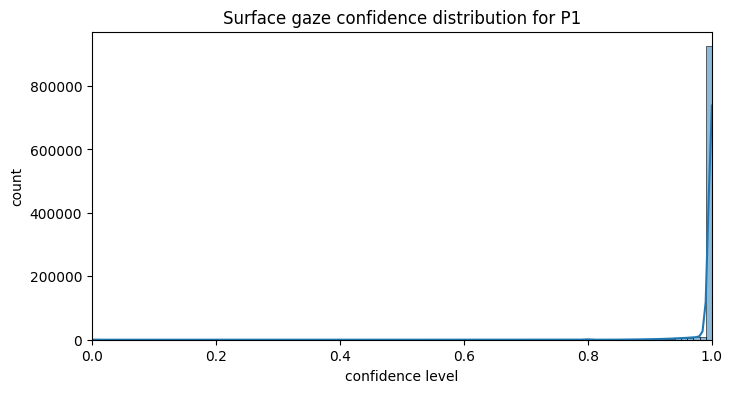

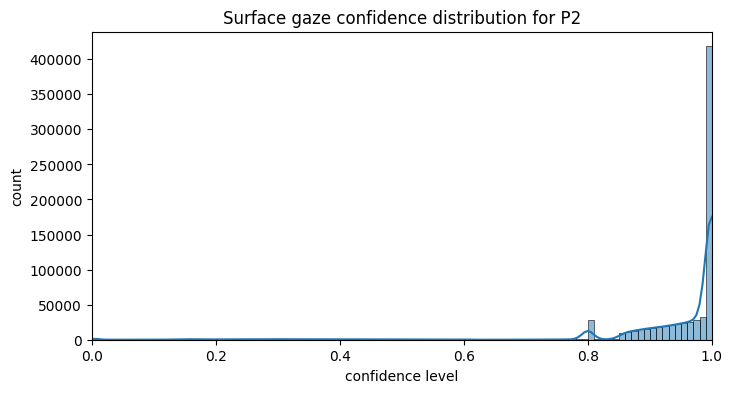

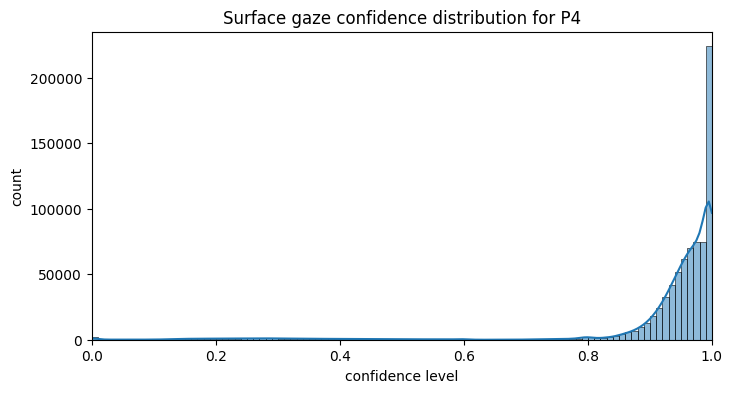

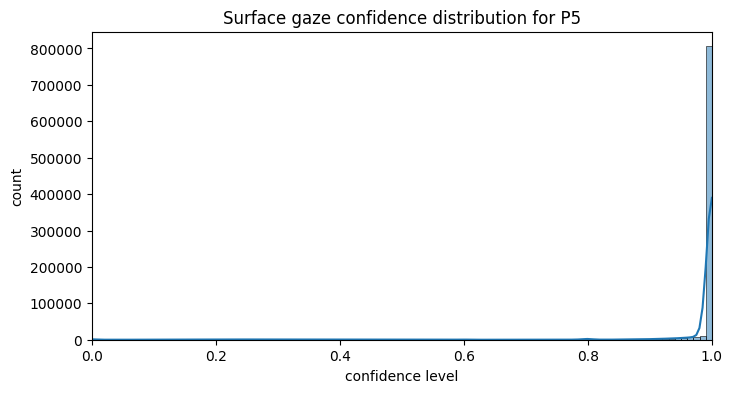

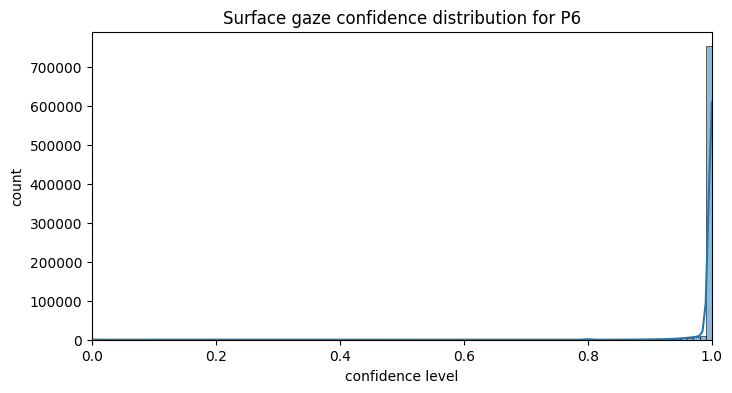

...

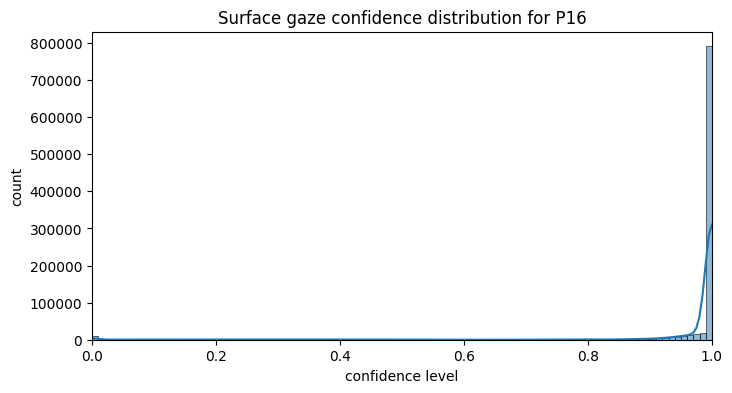

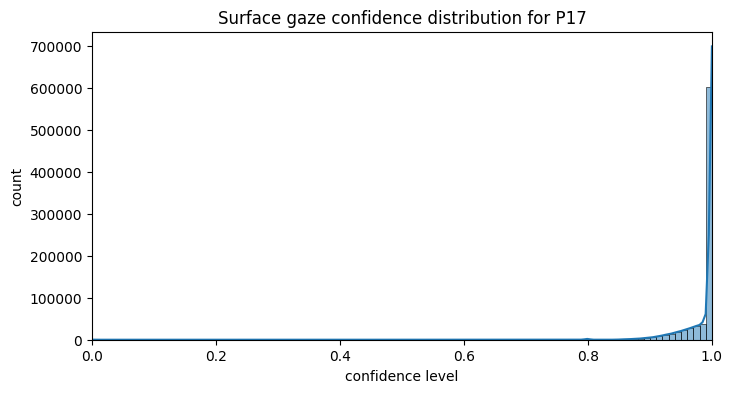

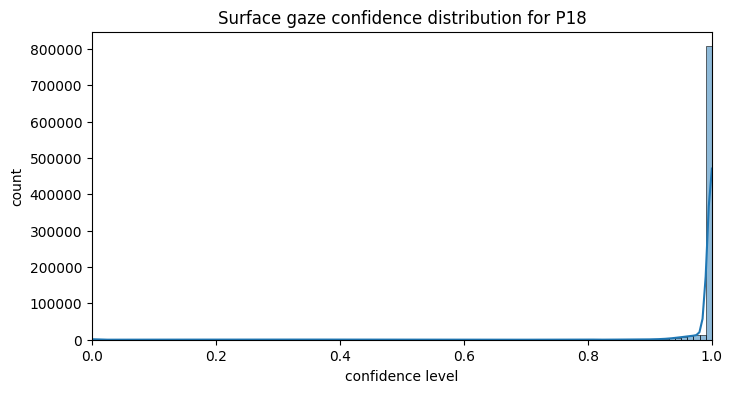

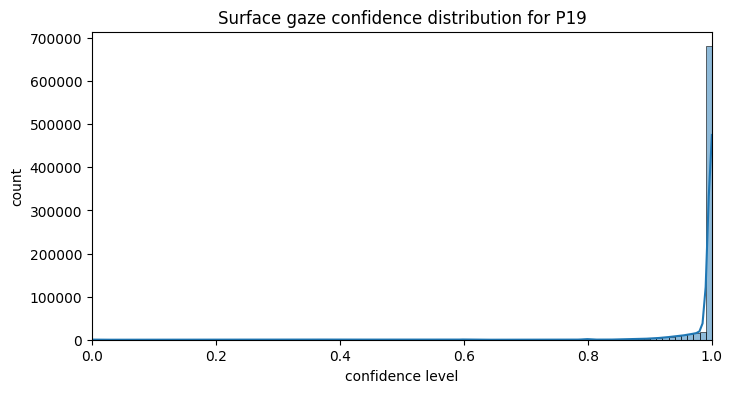

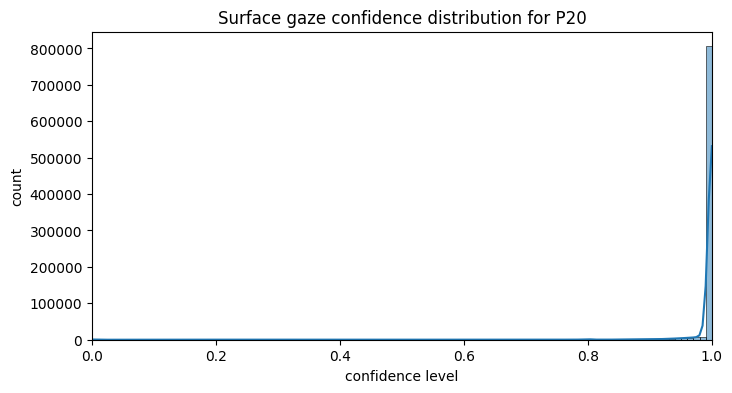

In [16]:
for pid in participant_ids:
    participant_ddf = ddf[ddf['participant_id'] == pid]
    plt.figure(figsize=(8, 4))
    sns.histplot(participant_ddf['confidence'], bins=100, kde=True)
    plt.title(f'Surface gaze confidence distribution for P{pid}')
    plt.xlabel('confidence level')
    plt.ylabel('count')
    plt.xlim(0,1)
    plt.show()

##### Normalized x-y position distribution
- Irregular normal distribution

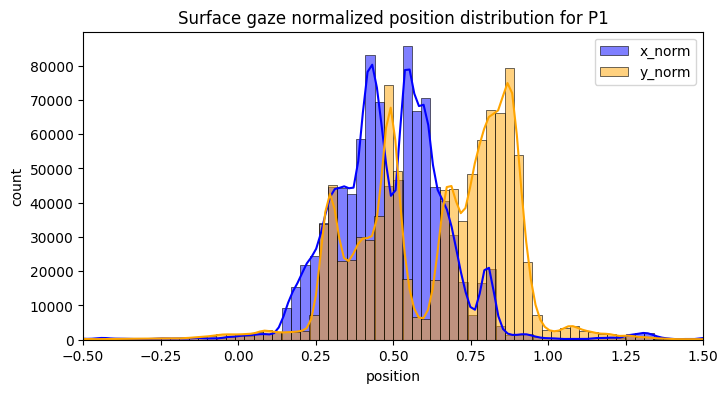

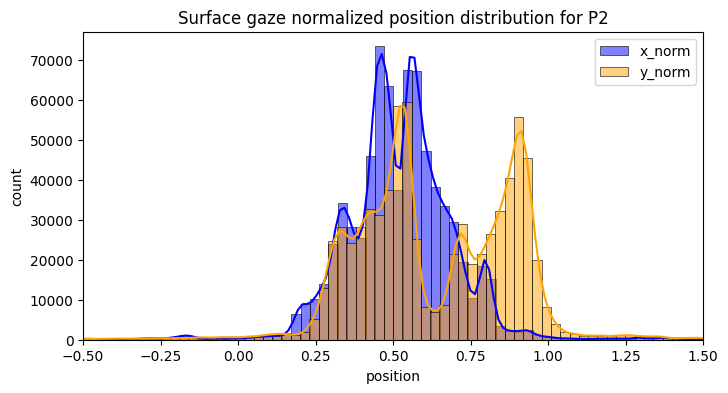

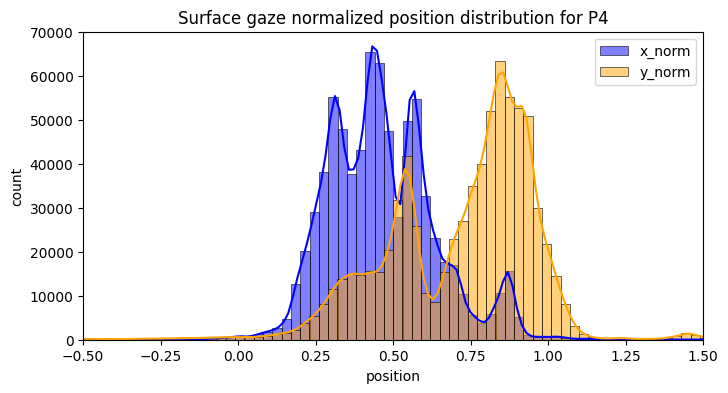

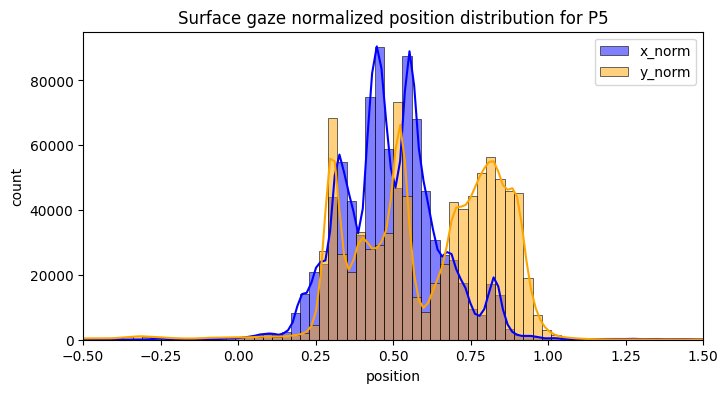

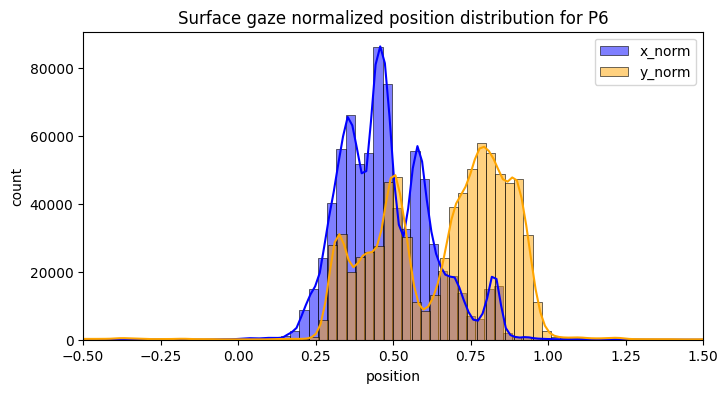

...

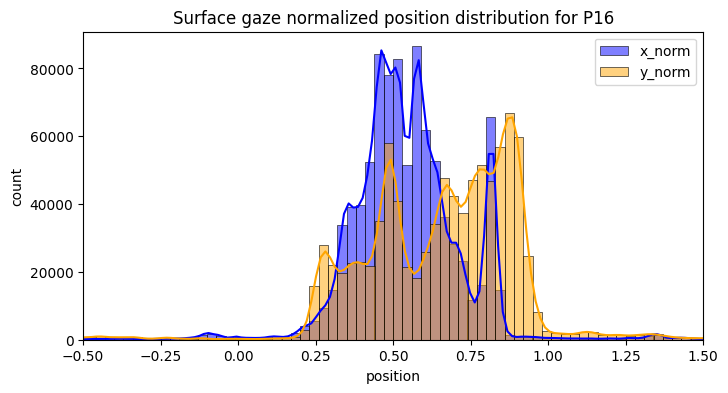

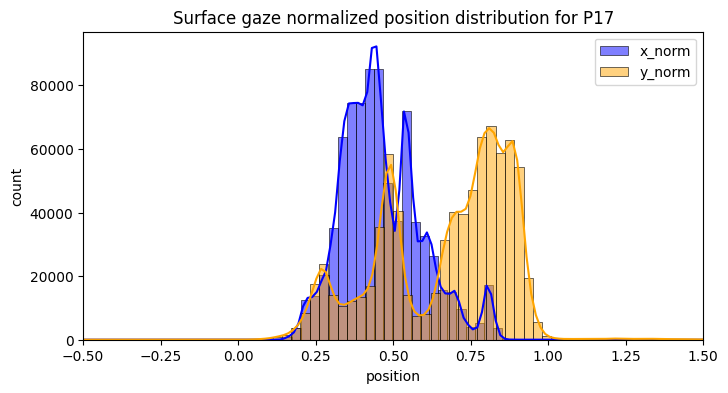

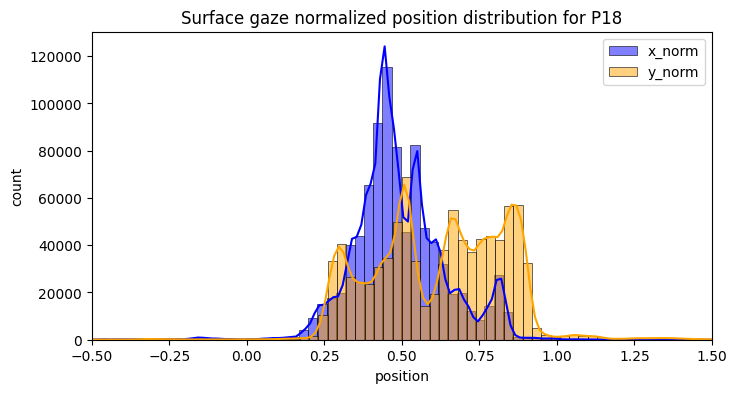

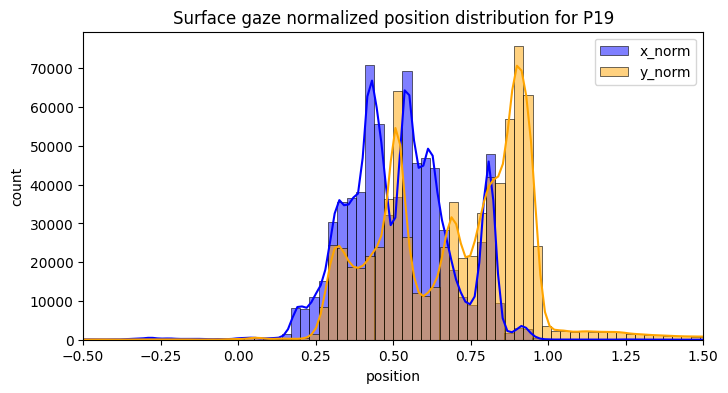

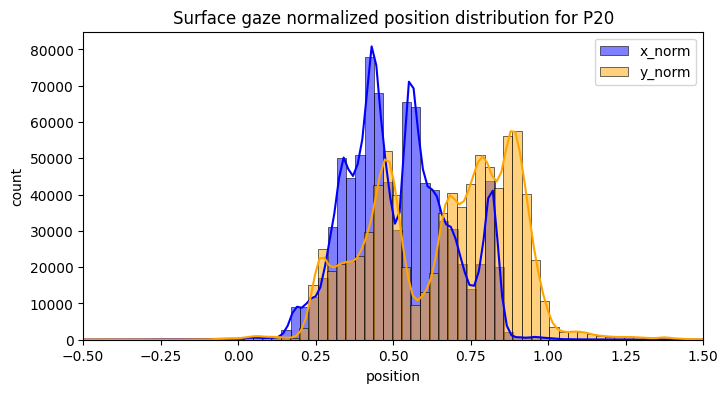

In [17]:
filtered_x = ddf[(ddf['x_norm'] > -1) & (ddf['x_norm'] < 2)][['participant_id', 'confidence',  'x_norm',]]
filtered_y = ddf[(ddf['y_norm'] > -1) & (ddf['y_norm'] < 2)][['participant_id', 'confidence',  'y_norm',]]
for pid in participant_ids:
    participant_x = filtered_x[filtered_x['participant_id'] == pid]
    participant_y = filtered_y[filtered_y['participant_id'] == pid]
    plt.figure(figsize=(8, 4))
    sns.histplot(participant_x['x_norm'], bins=100, kde=True, color='blue', label='x_norm')
    sns.histplot(participant_y['y_norm'], bins=100, kde=True, color='orange', label='y_norm')
    plt.title(f'Surface gaze normalized position distribution for P{pid}')
    plt.xlabel('position')
    plt.ylabel('count')
    plt.xlim(-0.5, 1.5)
    plt.legend()
    plt.show()

##### Confidence-normalized position correlation
- Data points with confidence = 0
- Weird cut-off around 0.6 and 0.7 confidence

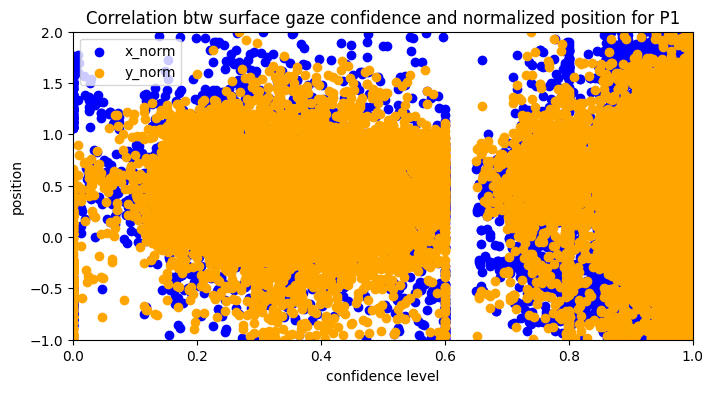

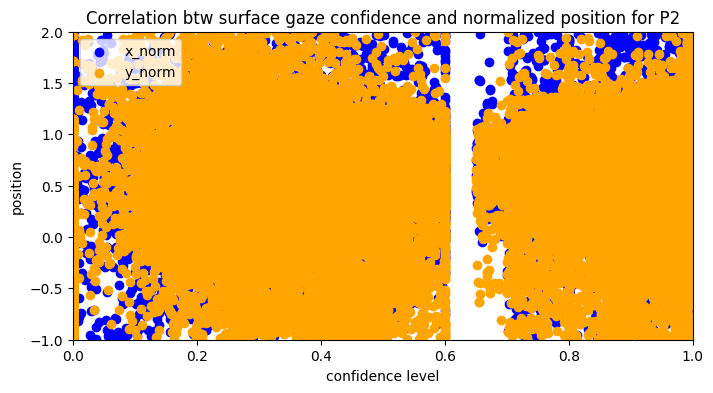

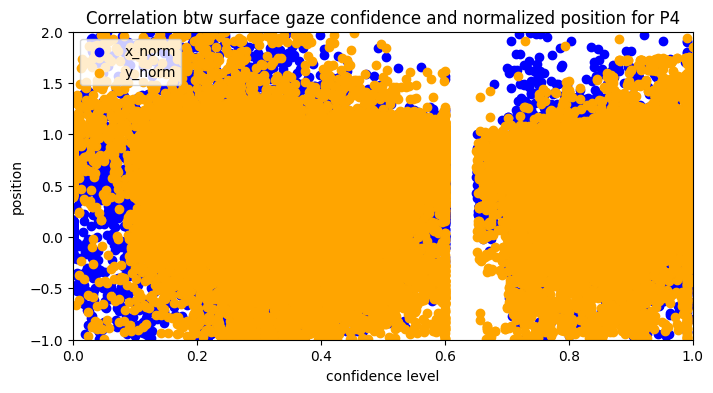

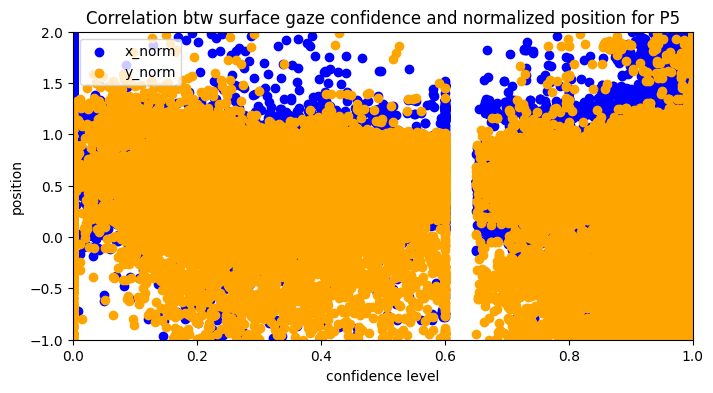

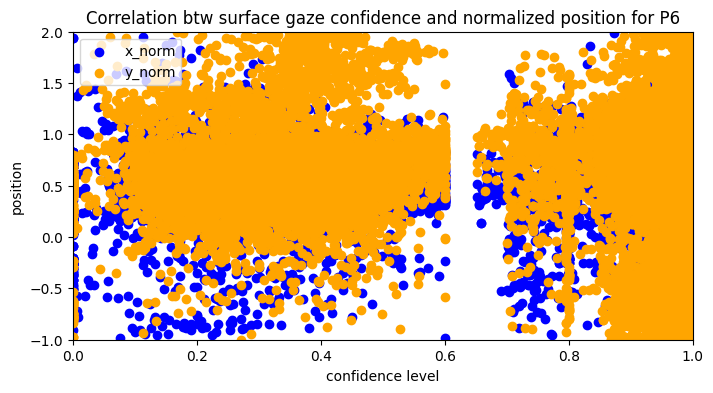

...

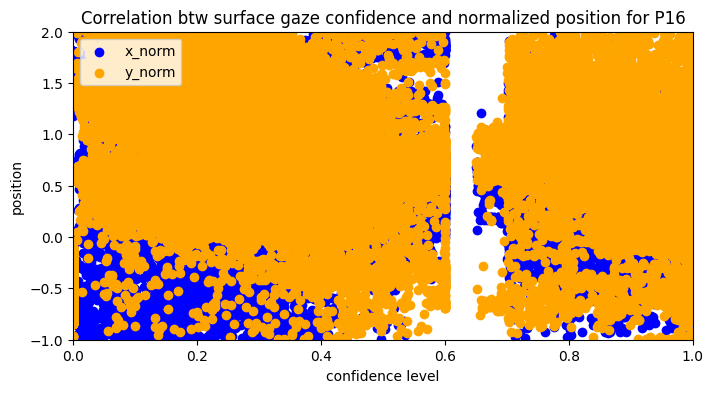

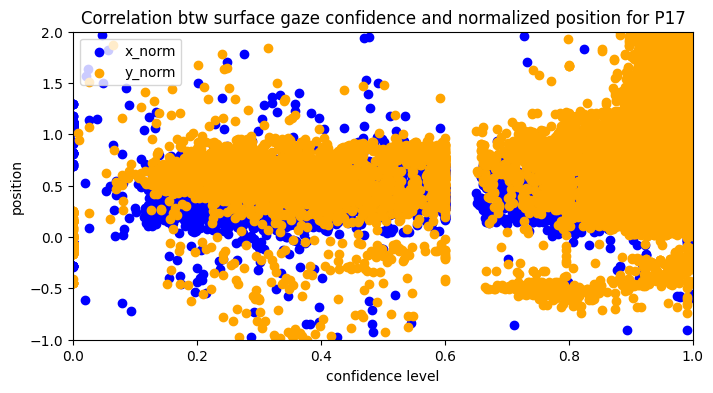

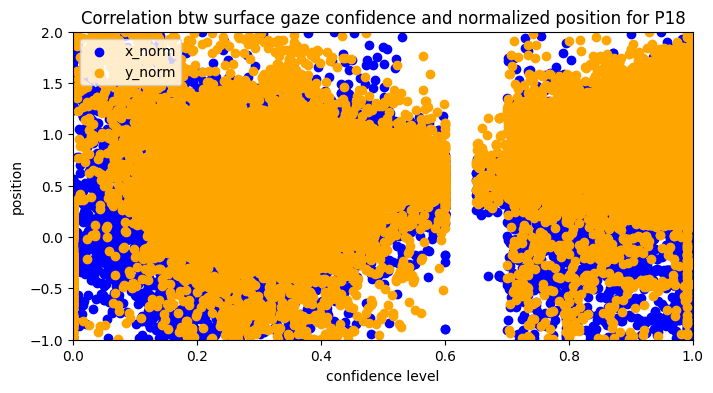

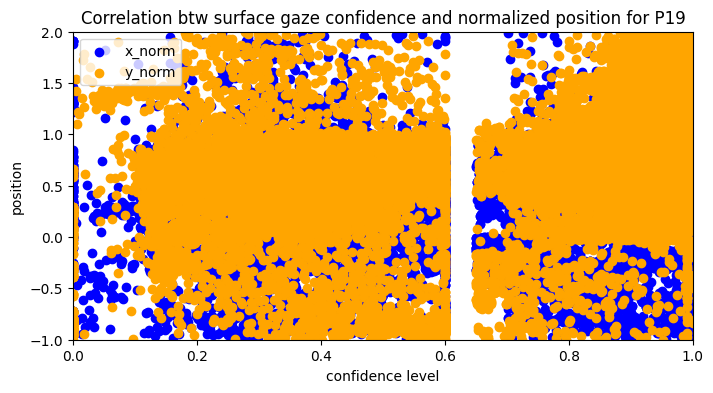

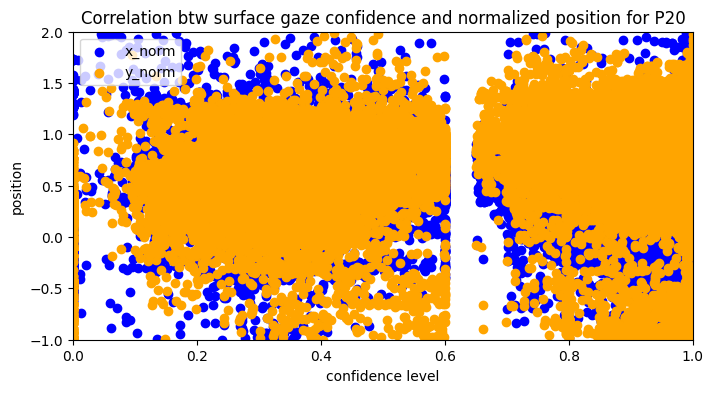

In [18]:
for pid in participant_ids:
    participant_ddf = ddf[ddf['participant_id'] == pid]
    participant_x = filtered_x[filtered_x['participant_id'] == pid]
    participant_y = filtered_y[filtered_y['participant_id'] == pid]
    plt.figure(figsize=(8, 4))
    plt.scatter(participant_x['confidence'], participant_x['x_norm'], color='blue', label='x_norm')
    plt.scatter(participant_y['confidence'], participant_y['y_norm'], color='orange', label='y_norm')
    plt.title(f'Correlation btw surface gaze confidence and normalized position for P{pid}')
    plt.xlabel('confidence level')
    plt.ylabel('position')
    plt.xlim(0, 1)
    plt.ylim(-1, 2)
    plt.legend(loc='upper left')
    plt.show()

##### Normalized position boxplot
- Many whiskers are NOT outliers

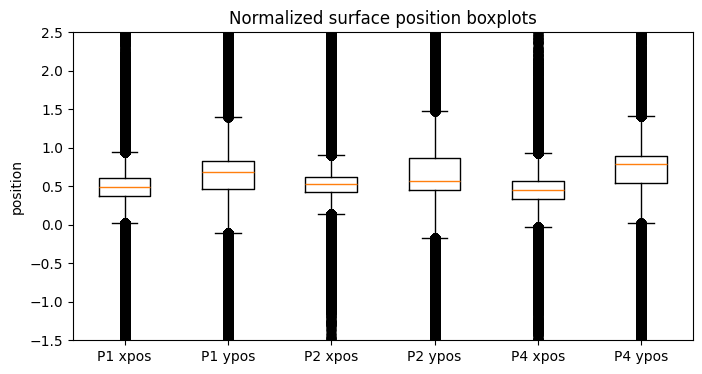

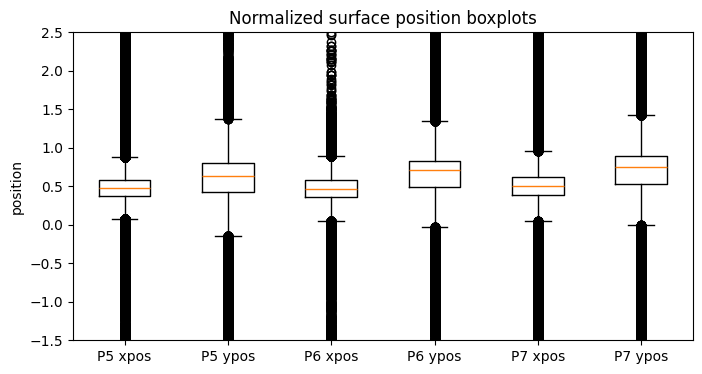

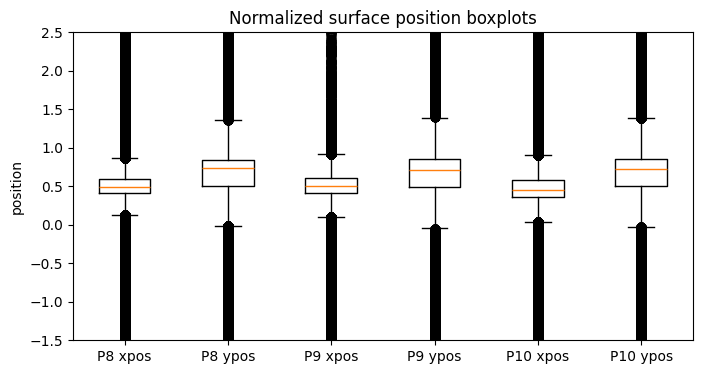

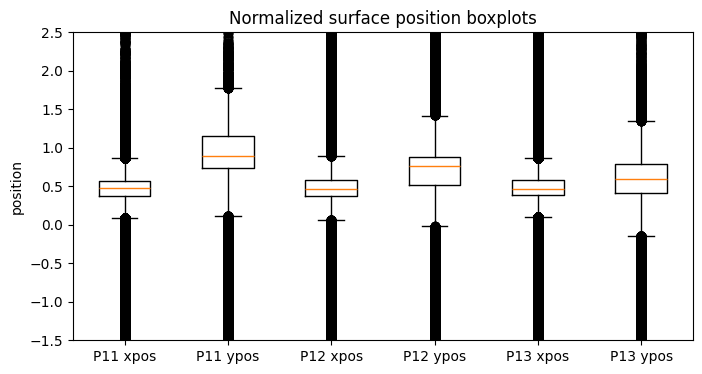

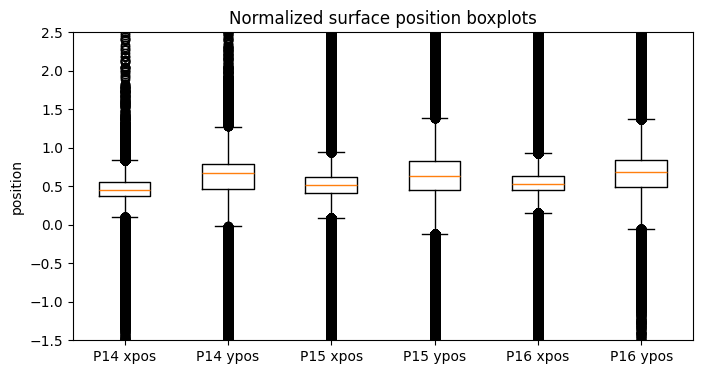

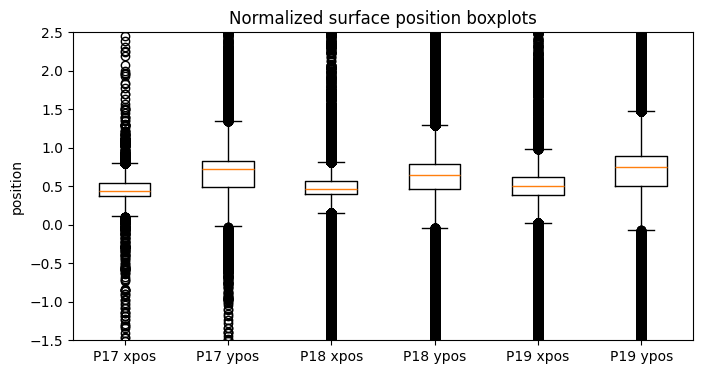

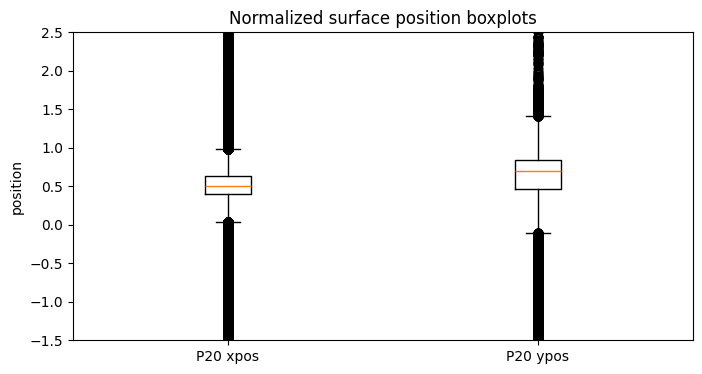

In [19]:
grouped_ids = [participant_ids[i:i+3] for i in range(0, len(participant_ids), 3)] #group ids
for group in grouped_ids: #iterate groups
    pos_ddf = []
    labels = []
    for pid in group:
        participant_ddf = ddf[ddf['participant_id'] == pid]
        x = participant_ddf['x_norm']
        y = participant_ddf['y_norm']
        pos_ddf.append(x)
        pos_ddf.append(y)
        labels.append(f'P{pid} xpos')
        labels.append(f'P{pid} ypos')
    plt.figure(figsize=(8, 4))
    plt.boxplot(pos_ddf, whis = 1.5)
    plt.title(f'Normalized surface position boxplots')
    plt.ylabel('position')
    plt.xticks(range(1, len(labels) + 1), labels)
    plt.ylim(-1.5, 2.5)
    plt.show()

##### Spatial distribution
- Check documentation on x/y_norm
- Many gaze point off surface

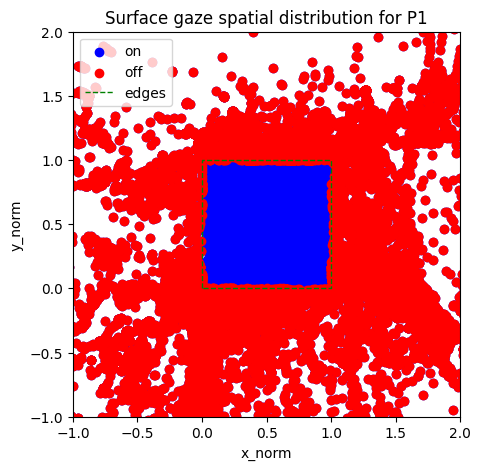

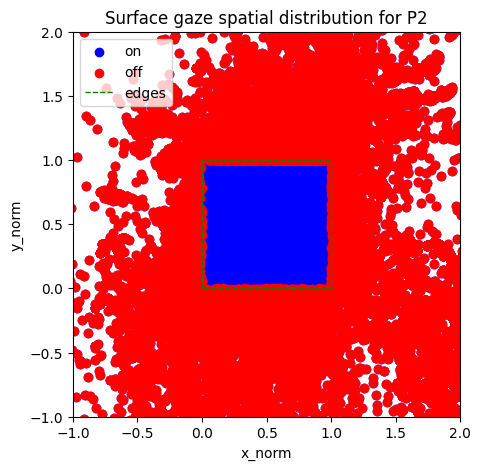

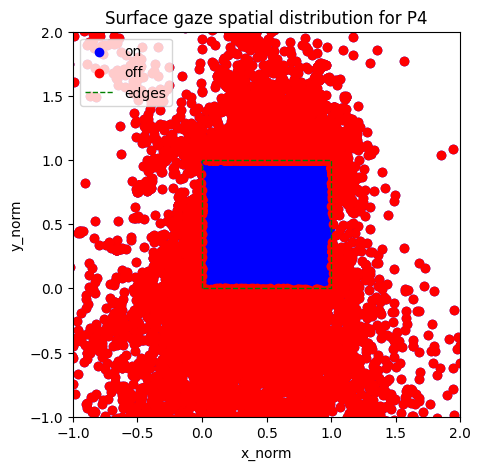

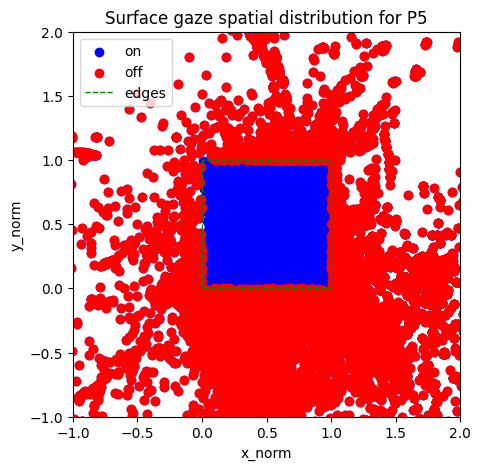

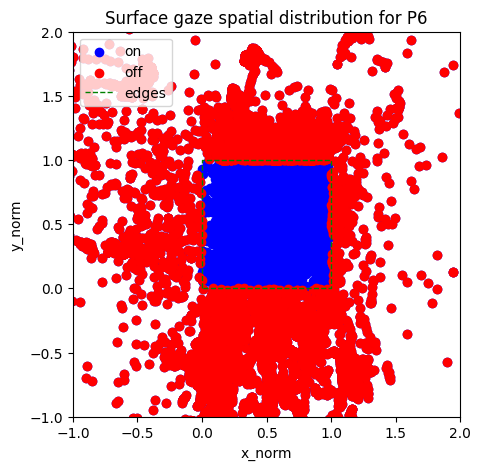

...

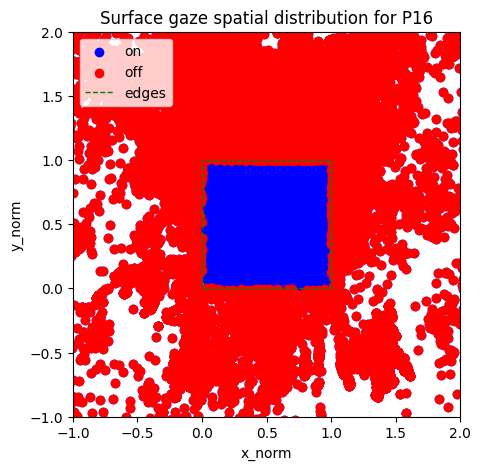

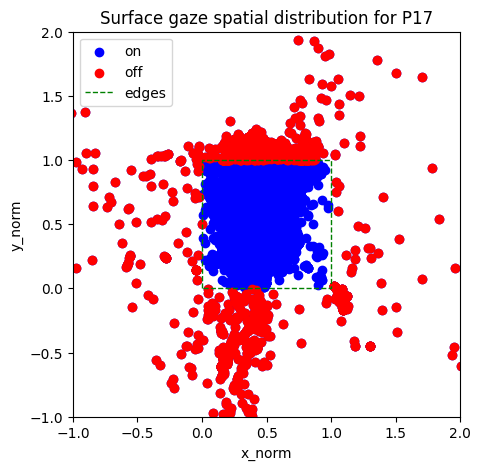

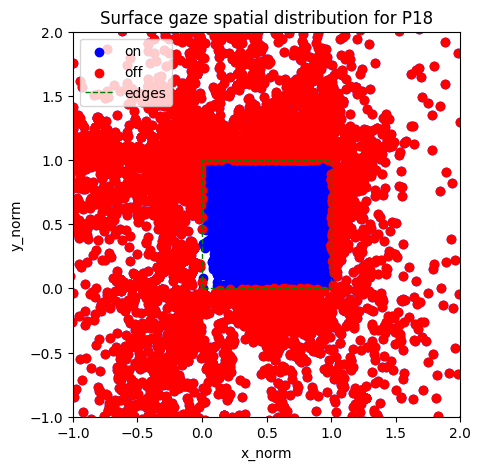

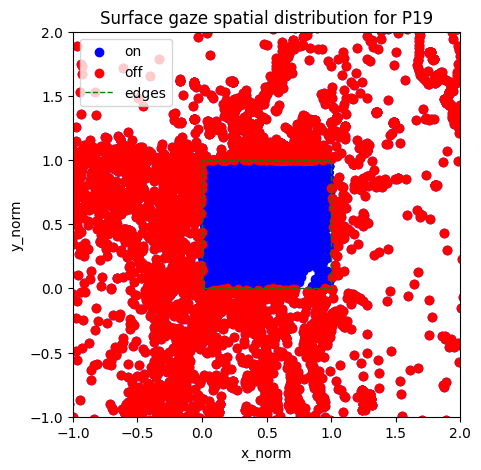

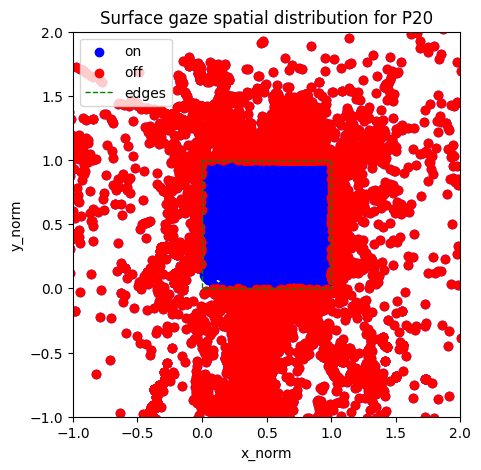

In [20]:
df['relative_timestamp'] = df.groupby('participant_id')['gaze_timestamp'].transform(lambda x: x - x.min())
for pid in participant_ids:
    participant_df = df[df['participant_id'] == pid]
    on_surface = participant_df[participant_df['on_surf'] == False]
    plt.figure(figsize=(5, 5))
    plt.scatter(participant_df['x_norm'], participant_df['y_norm'], color='blue', label='on')
    plt.scatter(on_surface['x_norm'], on_surface['y_norm'], color='red', label='off')

    # Draw closed rectangle
    rectangle_x = [0, 0, 1, 1, 0]
    rectangle_y = [0, 1, 1, 0, 0]
    plt.plot(rectangle_x, rectangle_y, color='green', linestyle='--', linewidth=1, label='edges')

    plt.title(f'Surface gaze spatial distribution for P{pid}')
    plt.xlabel('x_norm')
    plt.ylabel('y_norm')
    plt.xlim(-1, 2)
    plt.ylim(-1, 2)
    plt.legend(loc='upper left')
    plt.show()

##### Heatmap
- Centered gaze tendencies
- Top-left gaze tendency (lighter) --> warning popping-up location
- P11 anomaly

In [11]:
heatmap_df = df[(df['x_norm'] >= -.5) & (df['x_norm'] <= 1.5) & (df['y_norm'] >= -.5) & (df['y_norm'] <= 1.5)]

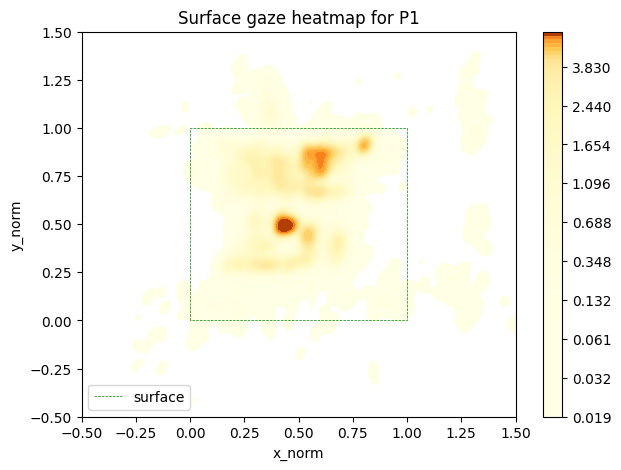

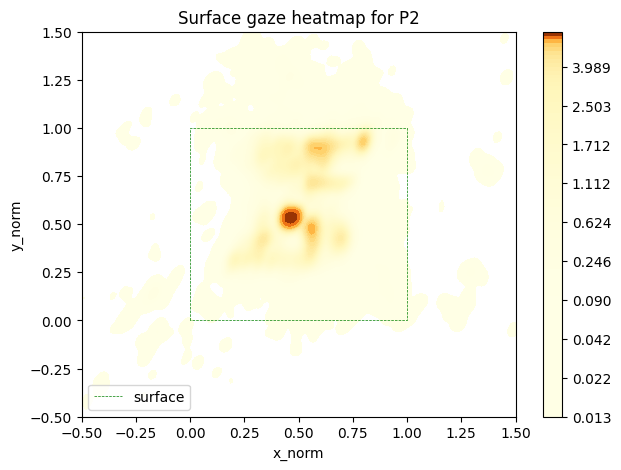

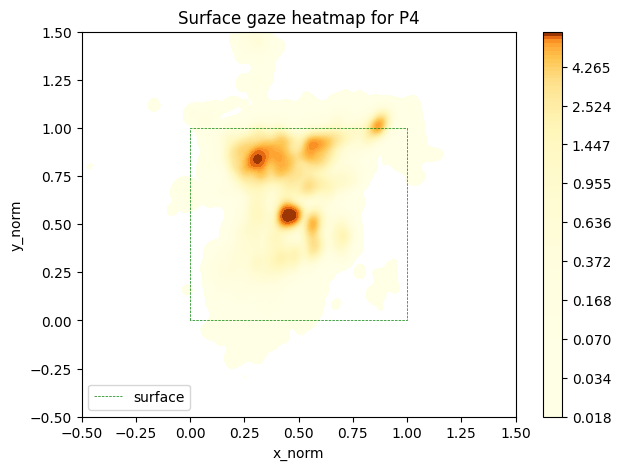

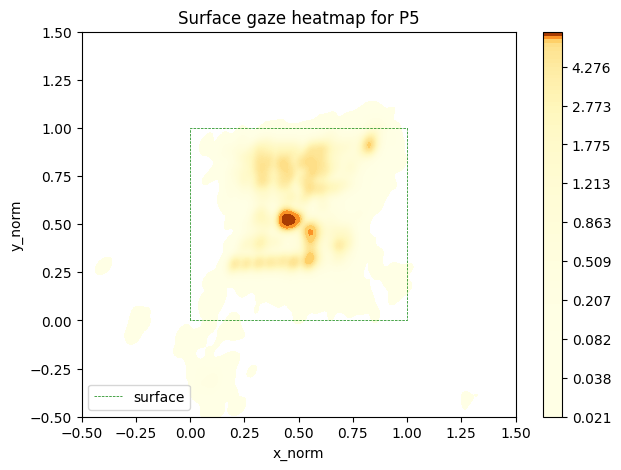

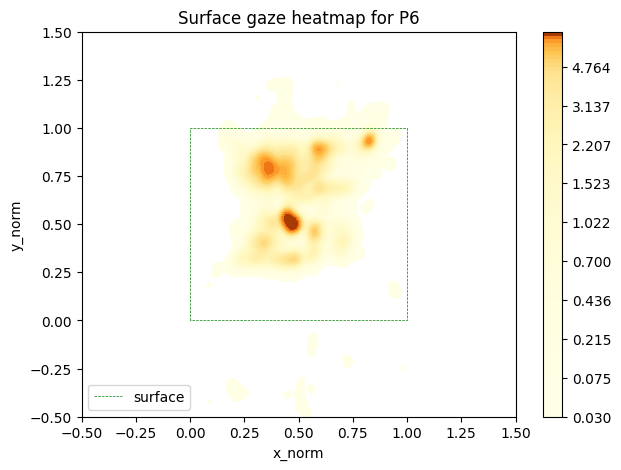

...

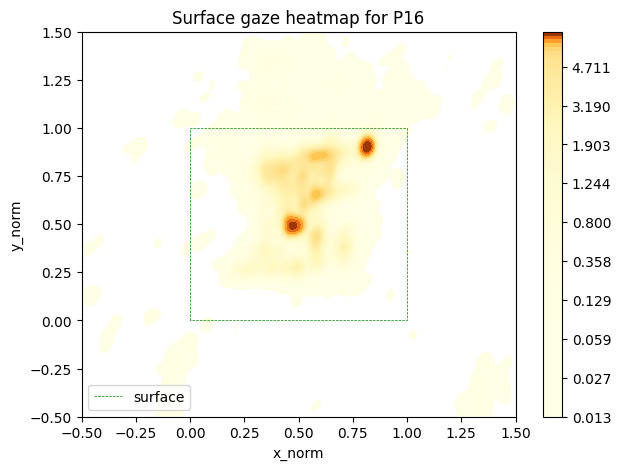

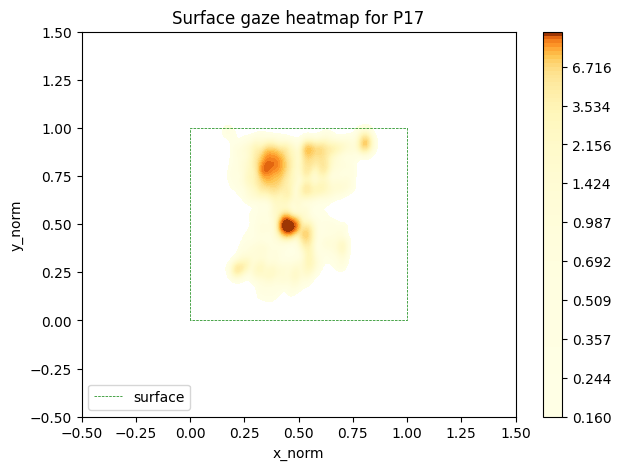

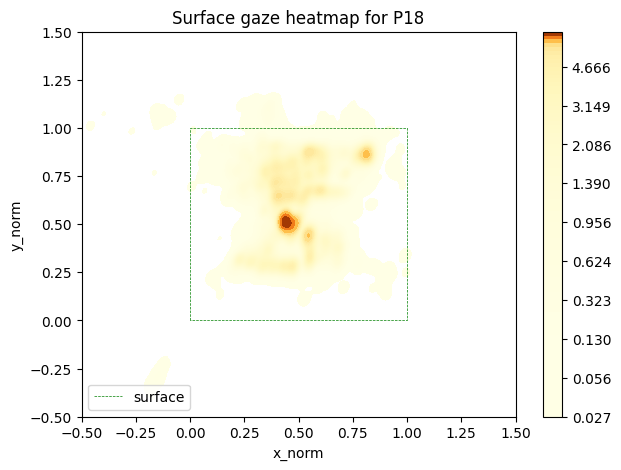

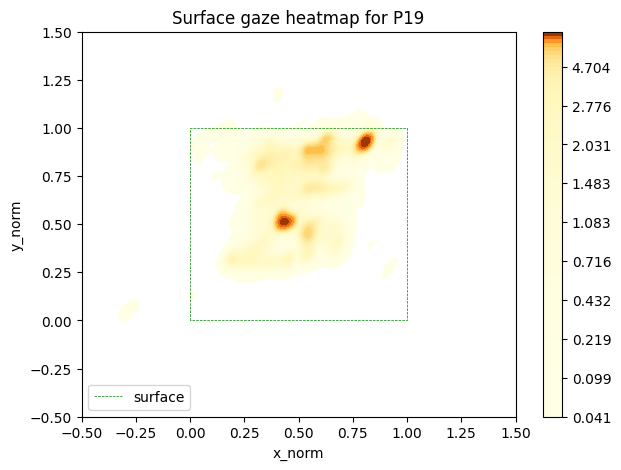

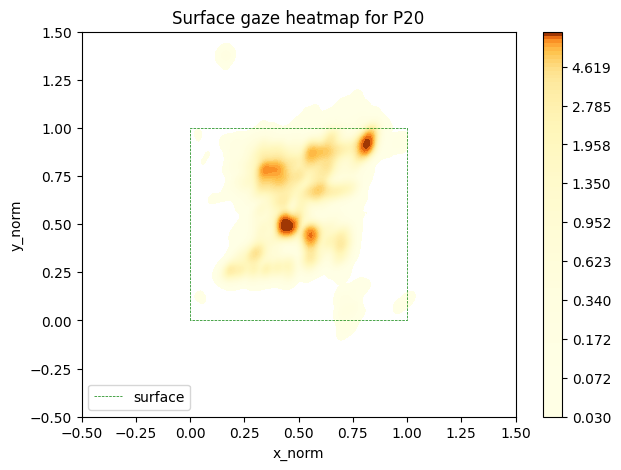

In [13]:
for pid in participant_ids:
    participant_df = heatmap_df[heatmap_df['participant_id'] == pid]

    plt.figure(figsize=(7, 5))

    # Creating the heatmap
    sns.kdeplot(
        x=participant_df['x_norm'], 
        y=participant_df['y_norm'],
        fill=True, 
        thresh=0,
        levels=np.logspace(-2, 0, 100),
        cmap=sns.color_palette("YlOrBr", as_cmap=True),
        cbar=True
    )

    # Draw closed rectangle
    rectangle_x = [0, 0, 1, 1, 0]
    rectangle_y = [0, 1, 1, 0, 0]
    plt.plot(rectangle_x, rectangle_y, color='green', linestyle='--', linewidth=0.5, label='surface')

    plt.title(f'Surface gaze heatmap for P{pid}')
    plt.xlabel('x_norm')
    plt.ylabel('y_norm')
    plt.xlim(-0.5, 1.5)
    plt.ylim(-0.5, 1.5)
    plt.legend(loc='lower left')
    plt.show()

### 3. Time-Series Assessment
Duration, Normalized position, Off-occurences

##### Confidence over time
- Higher variance compared to other parameters (same as gaze)
- Check surf_gaze confidence computation

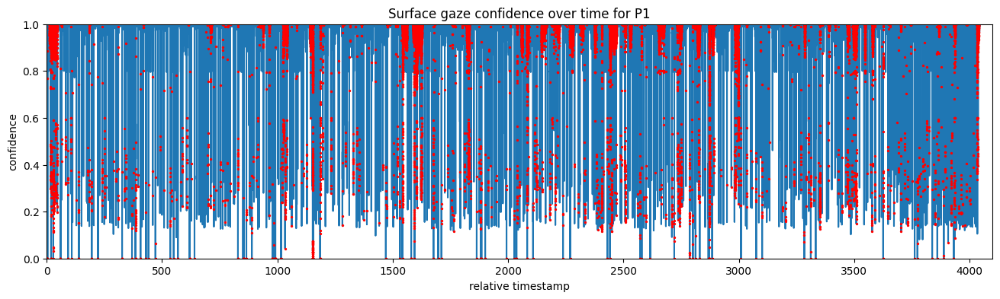

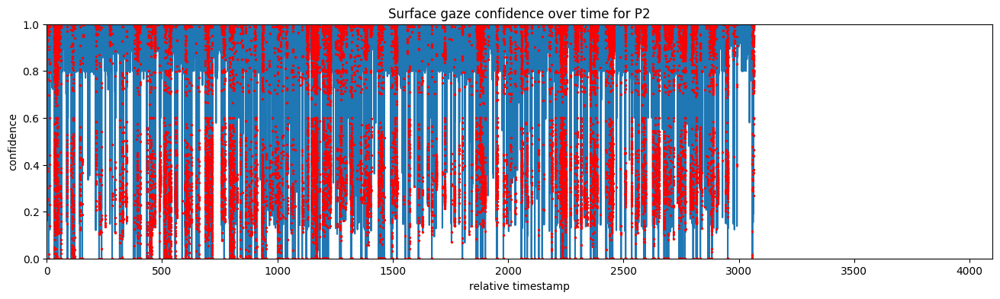

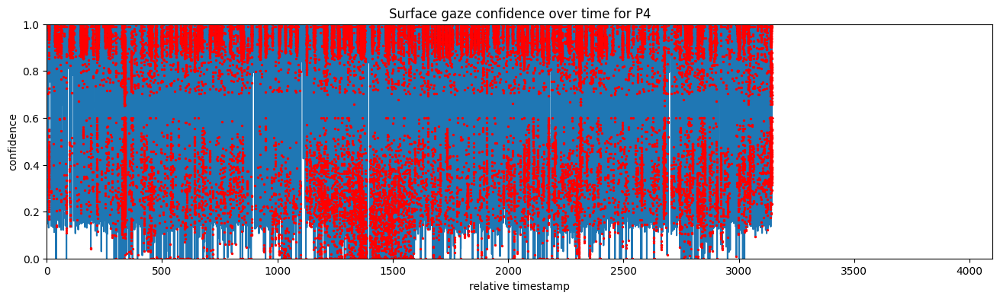

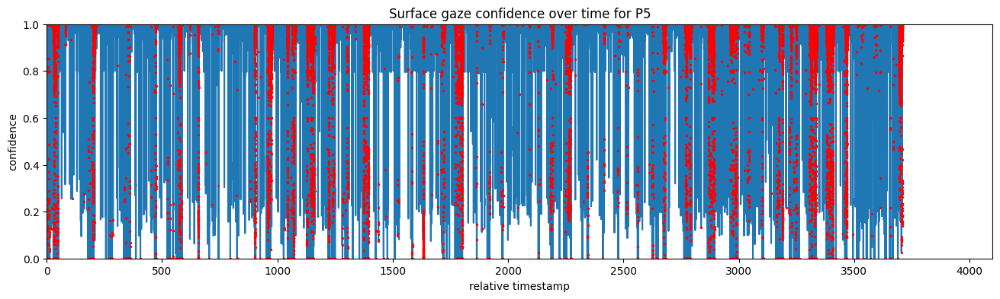

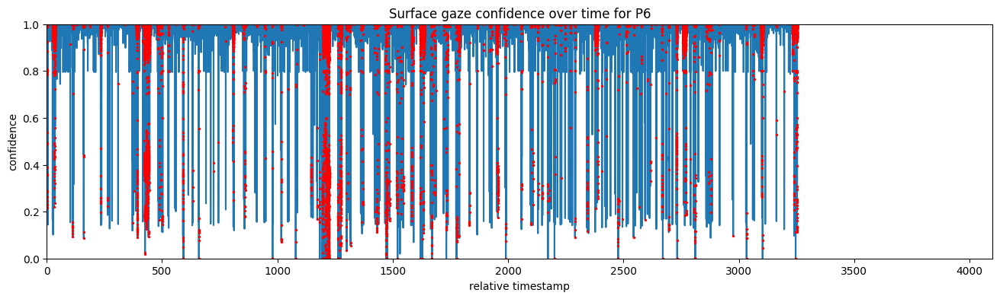

...

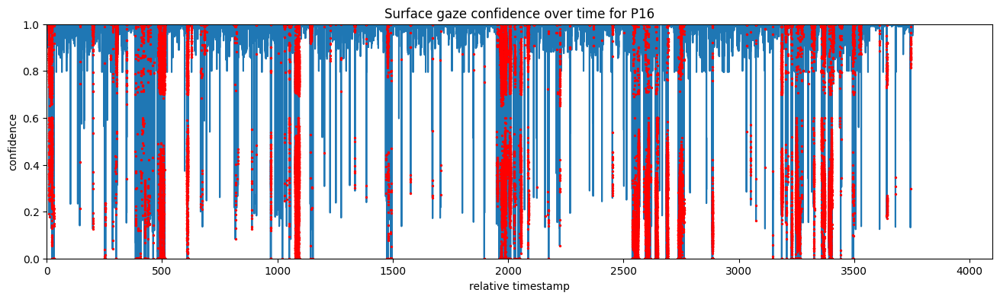

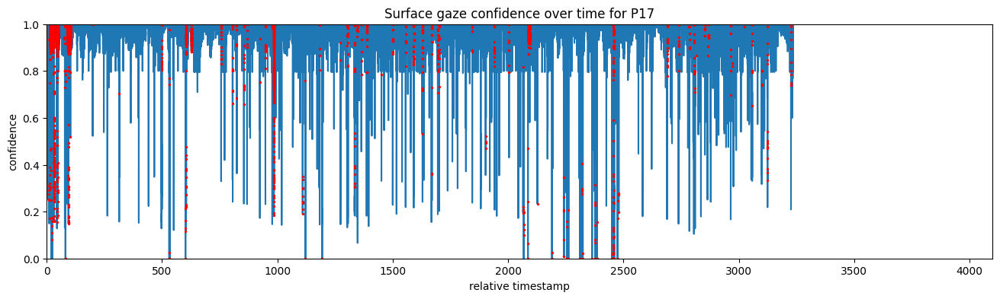

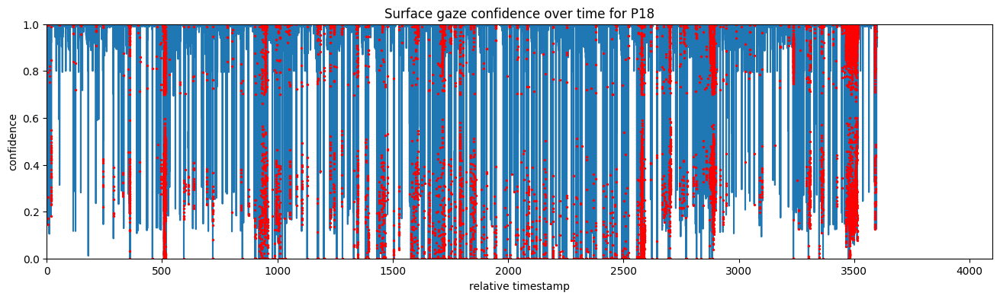

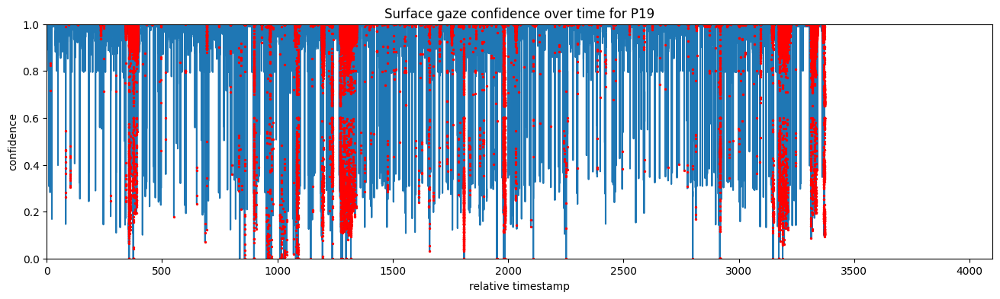

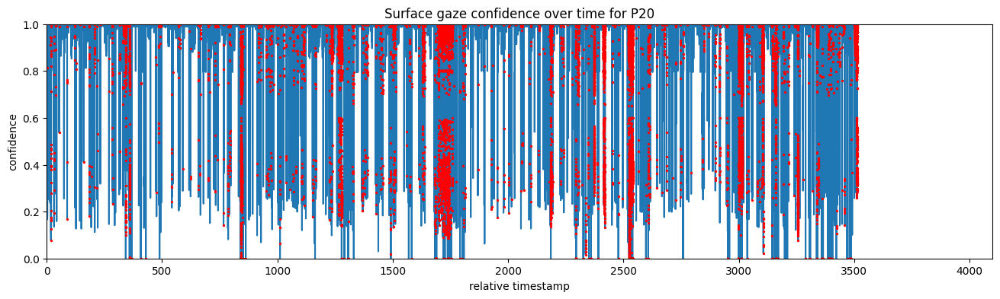

In [21]:
df['relative_timestamp'] = df.groupby('participant_id')['gaze_timestamp'].transform(lambda x: x - x.min())
for pid in participant_ids:
    participant_df = df[df['participant_id'] == pid]
    off_surface = participant_df[participant_df['on_surf'] == False]
    plt.figure(figsize=(16, 4))
    plt.plot(participant_df['relative_timestamp'], participant_df['confidence'])
    plt.scatter(off_surface['relative_timestamp'], off_surface['confidence'], color='red', s=2, label='off_surface', zorder=2)
    plt.title(f'Surface gaze confidence over time for P{pid}')
    plt.xlabel('relative timestamp')
    plt.ylabel('confidence')
    plt.xlim(0, 4100)
    plt.ylim(0, 1)
    plt.show()

##### Normalized position over time
- P11 positive y-shift over time
- Wider movement vs small dispersion periods (fixations vs saccades?)

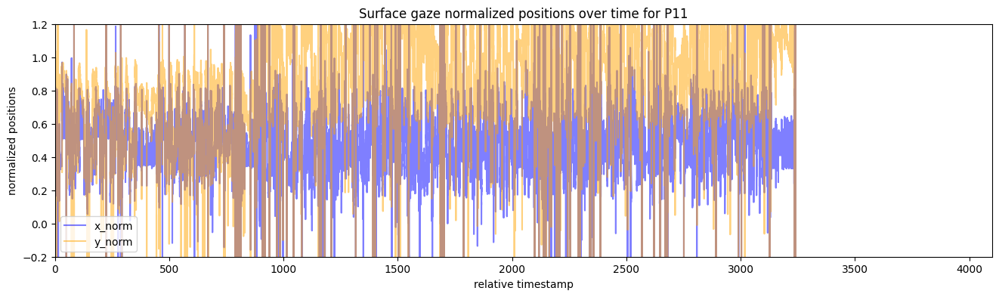

In [8]:
participant_df = df[df['participant_id'] == 11]
plt.figure(figsize=(16, 4))
plt.plot(participant_df['relative_timestamp'], participant_df['x_norm'], alpha = 0.5, color='blue', label='x_norm')
plt.plot(participant_df['relative_timestamp'], participant_df['y_norm'], alpha = 0.5, color='orange', label='y_norm')
plt.title('Surface gaze normalized positions over time for P11')
plt.xlabel('relative timestamp')
plt.ylabel('normalized positions')
plt.xlim(0, 4100)
plt.ylim(-0.2, 1.2)
plt.legend(loc='lower left')
plt.show()

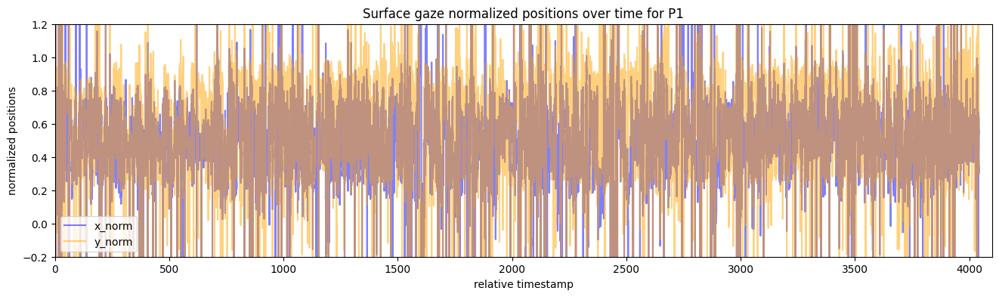

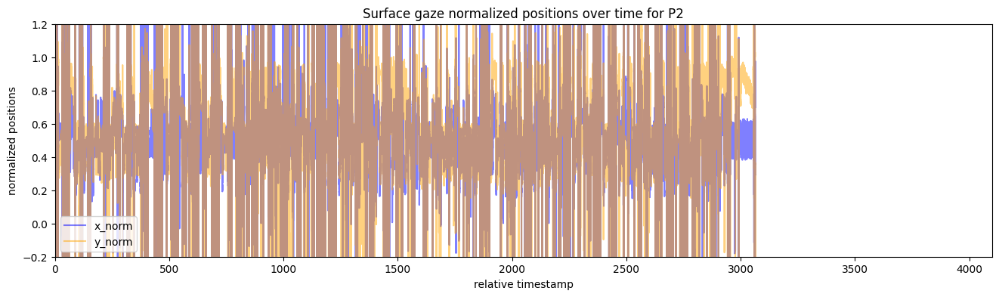

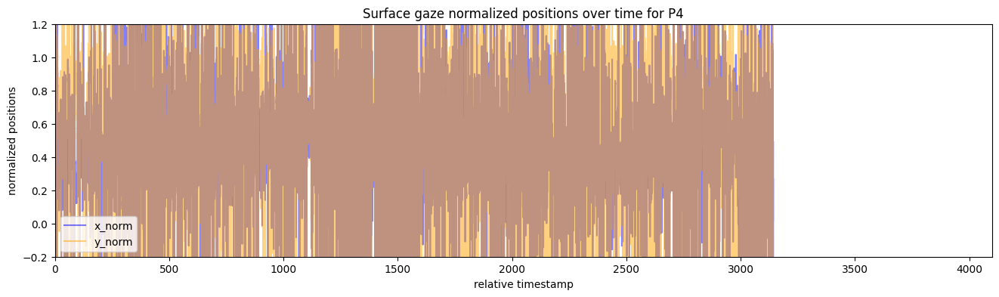

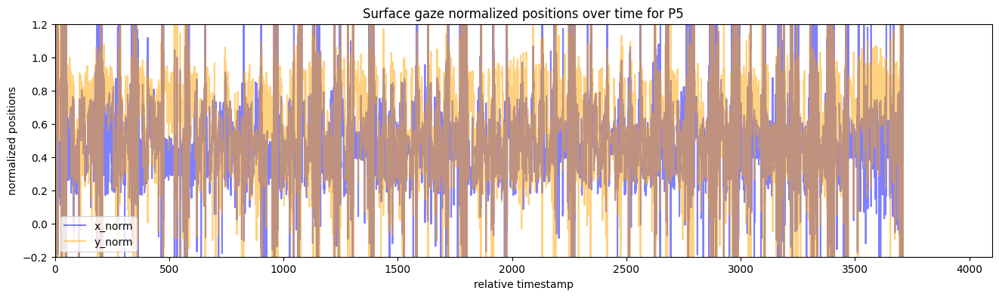

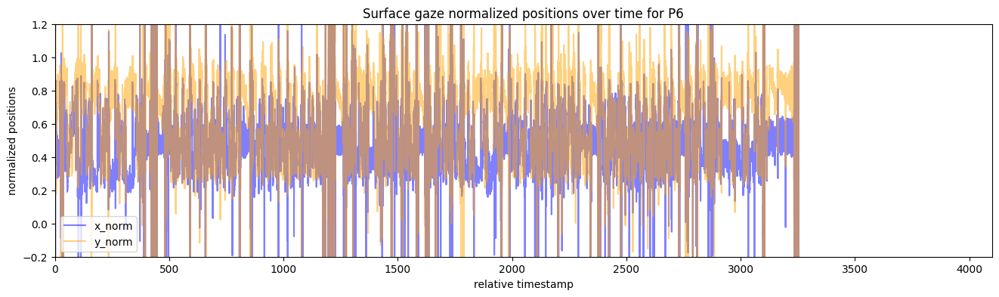

...

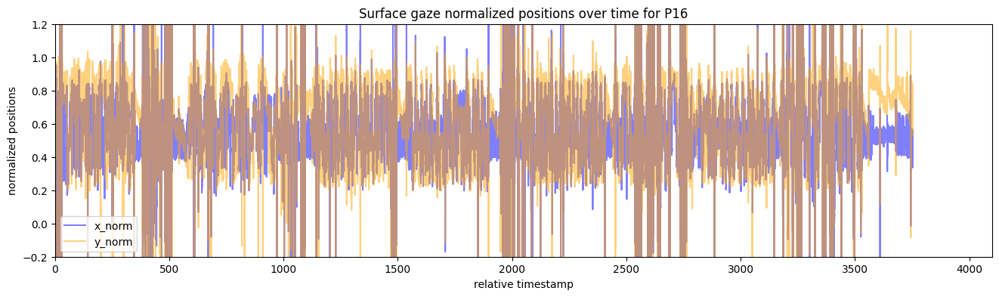

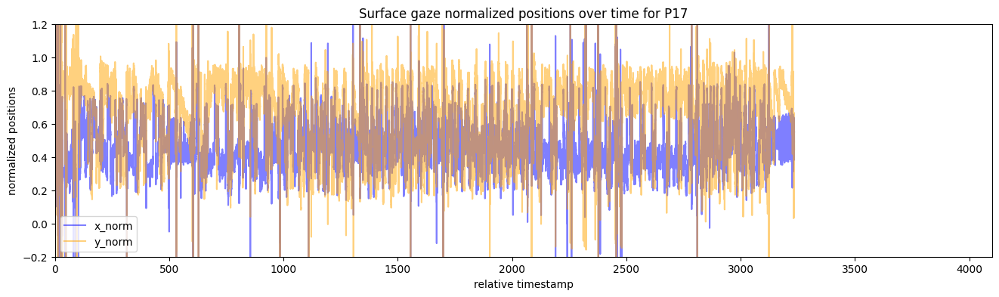

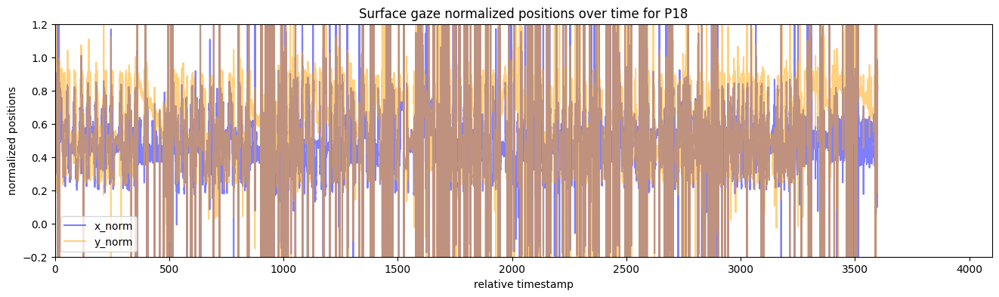

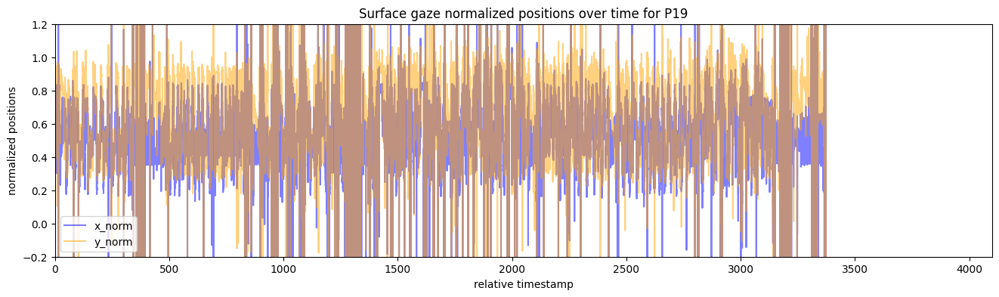

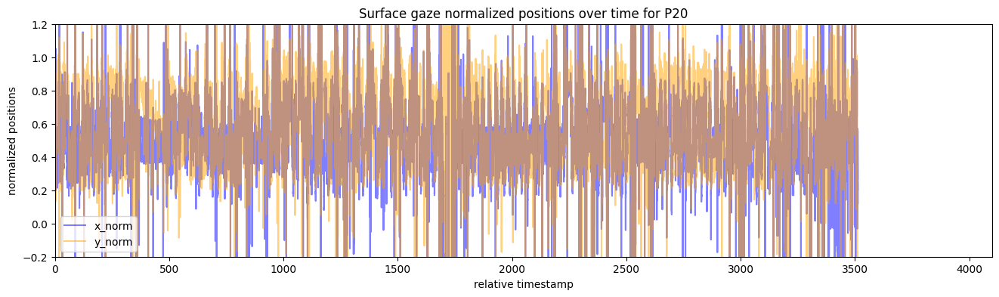

In [22]:
for pid in participant_ids:
    participant_df = df[df['participant_id'] == pid]
    plt.figure(figsize=(16, 4))
    plt.plot(participant_df['relative_timestamp'], participant_df['x_norm'], alpha = 0.5, color='blue', label='x_norm')
    plt.plot(participant_df['relative_timestamp'], participant_df['y_norm'], alpha = 0.5, color='orange', label='y_norm')
    plt.title(f'Surface gaze normalized positions over time for P{pid}')
    plt.xlabel('relative timestamp')
    plt.ylabel('normalized positions')
    plt.xlim(0, 4100)
    plt.ylim(-0.2, 1.2)
    plt.legend(loc='lower left')
    plt.show()

##### Off-screen occurences
- Many off-screen occurences for P4, P8, P11
- Some off-screen concentrations (artifacts?)

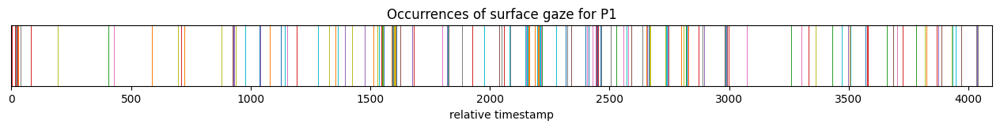

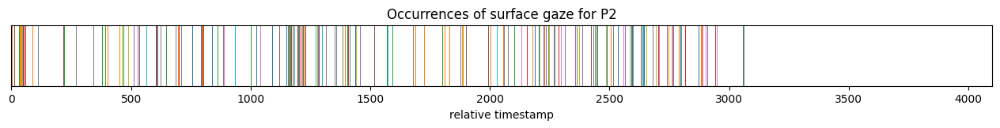

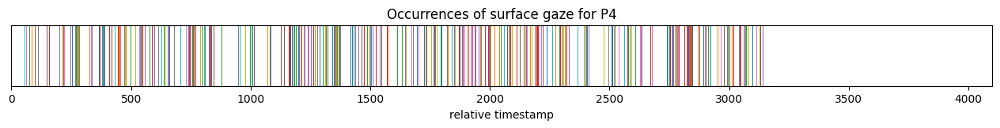

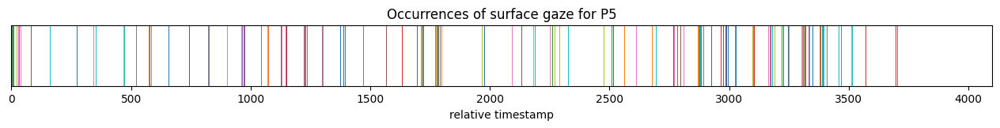

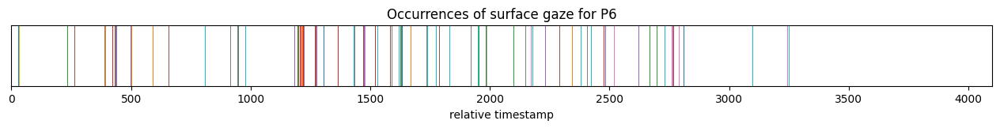

...

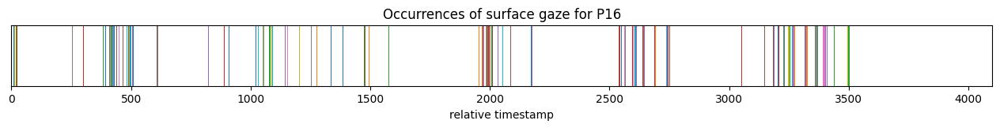

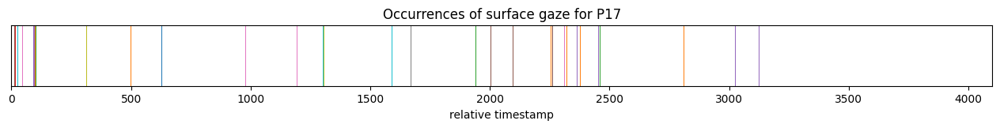

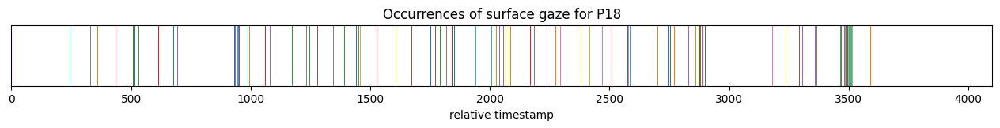

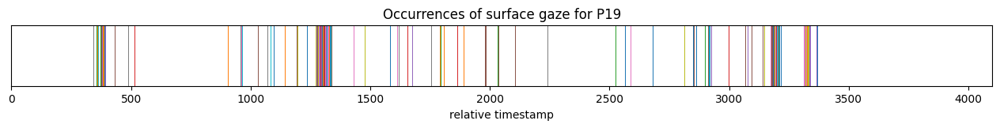

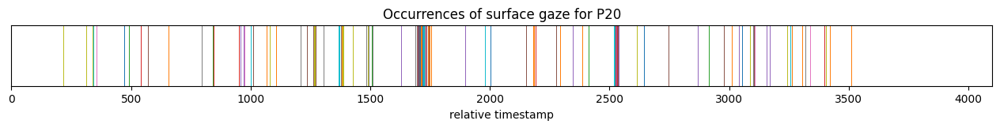

In [23]:
for pid in participant_ids:
    participant_off_df = df[(df['participant_id'] == pid) & (df['on_surf'] == False)]
    plt.figure(figsize=(16, 1))
    for _, row in participant_off_df.iterrows():
        start = row['relative_timestamp']
        plt.bar(start, 0.5, 0.5, align='edge')
    plt.title(f'Occurrences of surface gaze for P{pid}')
    plt.xlabel('relative timestamp')
    plt.xlim(0, 4100)
    plt.ylim(0, 0.5)
    plt.gca().get_yaxis().set_visible(False)
    plt.show()